# Image Segmentation using Clustering

You will use clustering algorithms to generate a segmentation of an image.  An image segmentation is a separation of an image into regions belonging to distinct objects.
First we need to initialize Python.  Run the below cell.

In [1]:
%matplotlib inline
import IPython.core.display         
# setup output image format (Chrome works best) 
# jpg is better for images
IPython.core.display.set_matplotlib_formats("jpg")
import matplotlib.pyplot as plt
import matplotlib
from numpy import *
from sklearn import *
import glob
import os
import csv
import string
import skimage.io
import skimage.color
import skimage.util
random.seed(100)


## 1. Loading Data and Pre-processing
Next we need to load the data.  Download `imgdb.zip`, and unzip it in the same directory as this ipynb file.  Then run the following cell to load the image data.

In [2]:
filelist = glob.glob('imgdb/jpg/*.jpg')
gtpath   = 'imgdb/gtruth/'
imgdata = []
gtdata  = []

# load image data
for f in filelist:
    # load image - byte [0 to 255]
    img = skimage.io.imread(f)

    (fdir1, fname)  = os.path.split(f)        

    # load GT segmentation (non-consecutive integers)
    gname = gtpath + fname[:-4] + "-gt.png"
    gtimg = skimage.io.imread(gname)

    # convert to consecutive integers
    cl = unique(gtimg)
    gtimg0 = gtimg.copy().astype(float64)
    for i in range(len(cl)):
        gtimg0[gtimg==cl[i]] = i

    imgdata.append(img)
    gtdata.append(gtimg0)
print(len(imgdata))

14


There are 14 images.  Each image also has a ground-truth segmentation that was created by a human annotation.  Here is an example:

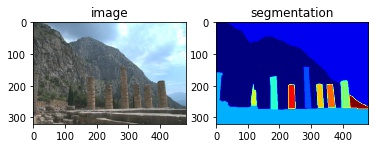

In [3]:
plt.subplot(1,2,1)
plt.imshow(imgdata[6], aspect='equal')# change the image: image[0-13]
plt.title('image')
plt.subplot(1,2,2)
plt.imshow(gtdata[6], aspect='equal', cmap='jet')
plt.title('segmentation');

## 2. Clustering with Color Features
To segment an image, we will extract features from each pixel location.  Then, we cluster the extracted features into groups.  Pixel location that are clustered into the same group form a segment.

For the features, we will use the "Lab" colorspace, rather than the RGB colors.  Also, we will ignore the "L" feature, which is brightness, resulting in a 2-dimensional color feature space (a, b). Here are a few helper functions: 
- getfeatures(): Extract Lab features along a regular grid on the image; 
- labels2seg(): Convert cluster labels into a segmentation image; 
- colorsegms(): Color a segmentation image using colors from the original image.

In [4]:
def getfeatures(img, segm=None, stepsize=7, use_loc = False):
    """
    getfeatures - extract features from an image
     [X, Y, L] = getfeatures(img, stepsize)
     INPUT
     img      - the image   [type = np.ndarray or Image]
     segm     - the gt segmentation (optional)
     stepsize - window stepsize
     OUTPUT
      X   - the features: each row is a feature vector  [type = np.ndarray]
      Y   - the GT segment labels for each feature (if segm is provided)
      L   - dictionary containing location information of each feature
    """
    winsize = 7 # ensure it is an odd number
    if stepsize > winsize:
        raise Exception('stepsize larger than window size')
    # convert to LAB
    yimg = skimage.color.rgb2lab(img)

    offset = floor((winsize-1)/2)
    sy,sx, sc = img.shape

    if use_loc:
        Xdim = 4
    else:
        Xdim = 2
    
    # extract window patches with stepsize
    patches = skimage.util.view_as_windows(yimg, (winsize, winsize, 3), step=stepsize)    
    psize = patches.shape
    
    # get coordinates of windows
    rangex = arange(psize[1])*stepsize + offset
    rangey = arange(psize[0])*stepsize + offset

    X = zeros((psize[0] * psize[1], Xdim));
    
    if segm is None:
        Y = None
    else:
        Y = zeros((X.shape[0],))
    
    i = 0
    for x in range(psize[1]):
        for y in range(psize[0]):
            myu = mean(patches[y,x,0,:,:,1].flatten())
            myv = mean(patches[y,x,0,:,:,2].flatten())
            myy = int(rangey[y])
            myx = int(rangex[x])
            
            if use_loc:
                X[i,:] = [myu, myv, myx, myy]
            else:
                X[i,:] = [myu, myv]
                
            if Y is not None:
                Y[i] = segm[myy, myx]
                
            i = i + 1 
    
    L = {'rangex':rangex, 'rangey':rangey, 'offset':offset, 'sx':sx, 'sy':sy, \
         'stepsize':stepsize, 'winsize':winsize}
    return X, Y, L

def labels2seg(Y,L):
    """
    labels2segm - form a segmentation image using cluster labels
    segm = labels2segm(Y, L)
    Y - cluster labels for each location
    L - location dictionary from getfeatures
    segm - output segmentation image
    """
    segm = zeros((L['sy'], L['sx']))
    # <= offset if floor((winsize-1)/2)>= floor(stepsize/2) 
    rstep = int(floor(L['stepsize']/2.0)) 
    stepbox = range(-rstep, L['stepsize'] - rstep)
    rx = asarray(L['rangex'], dtype=int) + int(L['offset'])
    ry = asarray(L['rangey'], dtype=int) + int(L['offset'])
    Y_reshaped = Y.reshape((ry.size, rx.size),order='F')
    for i in stepbox:
        for j in stepbox:
            segm[ix_(ry + j, rx + i)] = Y_reshaped
    ## Now fil in the borders if they are missing
    minx = min(rx) + stepbox[0] - 1
    maxx = max(rx) + stepbox[-1] + 1
    miny = min(ry) + stepbox[0] - 1
    maxy = max(ry) + stepbox[-1] + 1

    if 0 <= minx:
        ## fill in left edge
        segm[:, 0:minx+1] = segm[:,minx+1].reshape((-1,1))
    if maxx < L['sx']:
        ## fill in right edge
        segm[:,maxx:] = segm[:,maxx-1].reshape((-1,1))
    if 0 < miny:
        ## fill in top edge
        segm[0:miny+1,:] = segm[miny+1,:].reshape((1,-1))
    if maxy < L['sy']:
        ## fill in bottom edge
        segm[maxy:,:] = segm[maxy-1,:].reshape((1,-1))
    return segm    

def colorsegms(segm, img):
    """
    colorsegm - color a segmentation based on the image
    csegm = colorsegm(segm, img)
    segm = the segmentation image  [type = np.ndarray]
    img = the original image    [type = np.ndarray (or Image)]
    csegm = the colored segmentation -- each segment is colored based on the 
            average pixel color within the segment.
    """
    img = asarray(img).copy()
    if segm.shape[0:2] != img.shape[0:2]:
        raise Exception('The shape of segmentation and image are not consistent') 
    rimg, gimg, bimg = img[:,:,0], img[:,:,1], img[:,:,2]
    for i in range(0, int(max(segm.flatten())) + 1):
        # assume label starts from 1
        ind = (segm == i)
        rimg[ind] = mean(rimg[ind].flatten())
        gimg[ind] = mean(gimg[ind].flatten())
        bimg[ind] = mean(bimg[ind].flatten())
    # handle outliers from DBSCAN
    ind = (segm == -1)
    rimg[ind] = 0
    gimg[ind] = 0
    bimg[ind] = 0
    return img

Next, we use the `getfeatures` function to extract features from an image.  `X` contains the feature vectors. `L` contains information about where each features was extracted, which is used later generate the segmentation.

(3060, 2)


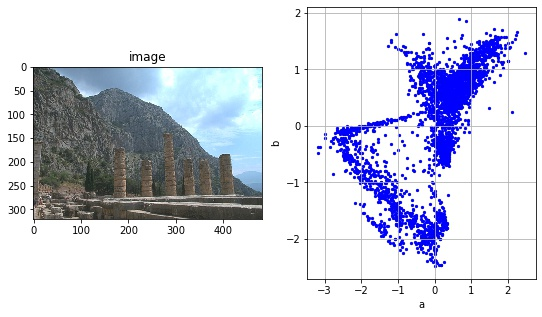

In [5]:
# image to use
img = imgdata[6]
gt  = gtdata[6]

# extract features, each row is a feature vector
Xo,Ytrue, L = getfeatures(img, gt)
print(Xo.shape)

# normalize features
scaler = preprocessing.StandardScaler()  
X = scaler.fit_transform(Xo)

# view the image
plt.figure(figsize=(9,5))
plt.subplot(1,2,1)
plt.imshow(img, interpolation='nearest')
plt.title("image")

# view the features
plt.subplot(1,2,2)
#plt.scatter(X[:,0], X[:,1], c='b', s=5, edgecolor='')
plt.scatter(X[:,0], X[:,1], c='b', s=5, edgecolor=None)
plt.ylabel('b'); plt.xlabel('a'); plt.grid(True)

Here is the segmented image, with the segment labels shown as colors.  The goal is to recoever these labels using clustering. 

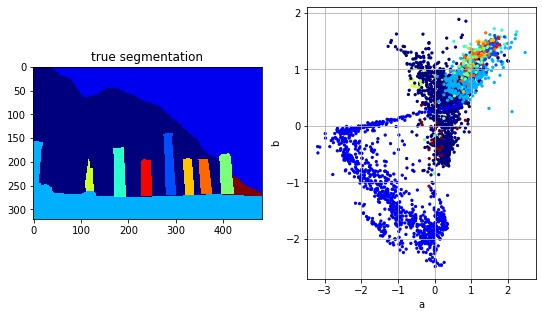

In [6]:
# view the image
plt.figure(figsize=(9,5))

plt.subplot(1,2,1)
plt.imshow(gt, interpolation='nearest', cmap='jet')
plt.title("true segmentation")

# view the features
plt.subplot(1,2,2)
plt.scatter(X[:,0], X[:,1], c=Ytrue, s=5, edgecolor=None, cmap='jet')
plt.ylabel('b'); plt.xlabel('a'); plt.grid(True)

Now use a clustering algorithm to group the data into **5** clusters.

In [7]:

from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=5, random_state=10)
kmeans.fit(X)

KMeans(n_clusters=5, random_state=10)

Once you have the cluster labels (Y), use the below code to generate the segmentation image and view it.  You can also view the scatter plot with `showscatter`.

In [8]:
def showsegm(segm, img):
    "show a segmentation"
    
    # fill segmentation with colors from the image
    csegm = colorsegms(segm, img)
    
    # view the images, segmentation, and ground-truth
    plt.figure(figsize=(9,6))
    plt.subplot(2,2,1)
    plt.imshow(img, interpolation='nearest')
    plt.title('image')
    plt.subplot(2,2,2)
    plt.imshow(segm, interpolation='nearest', cmap='jet')
    plt.title('segmentation')
    plt.subplot(2,2,3)
    plt.imshow(csegm, interpolation='nearest')
    plt.title('segmentation w/ color')
    plt.subplot(2,2,4)
    plt.imshow(gt, interpolation='nearest', cmap='jet')
    plt.title("ground truth")
    
    return segm

def showscatter(X,Y):
    "show a scatter plot of clusters"
    
    if X.shape[1] == 2:
        plt.figure()
        plt.scatter(X[:,0], X[:,1], c=Y, s=5, edgecolor=None, cmap='jet')
        plt.grid(True)
        plt.xlabel('a')
        plt.ylabel('b')
    else:
        plt.figure(figsize=(9,9))

        plt.subplot(2,2,1)
        plt.scatter(X[:,0], X[:,1], c=Y, s=5, edgecolor=None, cmap='jet')
        plt.xlabel('a'); plt.ylabel('b'); plt.grid(True)

        plt.subplot(2,2,2)
        plt.scatter(X[:,2], X[:,3], c=Y, s=5, edgecolor=None, cmap='jet')
        plt.xlabel('x-pos'); plt.ylabel('y-pos'); plt.grid(True)

        plt.subplot(2,2,3)
        plt.scatter(X[:,2], X[:,0], c=Y, s=5, edgecolor=None, cmap='jet')
        plt.xlabel('x-pos'); plt.ylabel('a'); plt.grid(True)

        plt.subplot(2,2,4)
        plt.scatter(X[:,3], X[:,1], c=Y, s=5, edgecolor=None, cmap='jet')
        plt.xlabel('y-pos'); plt.ylabel('b'); plt.grid(True)

Next we evaluate the segmentation with the ground-truth provided by a human annotator.  We cannot just check that the cluster assignments for each pixel are the same, since the cluster indices can be permuted.  We will use the [Adjusted Rand Index (ARI)](https://en.wikipedia.org/wiki/Rand_index#Adjusted_Rand_index), which calculates how often a pair of pixels is assigned correctly to the same cluster or not.  Use the below code to calculate the [ARI](https://scikit-learn.org/stable/modules/clustering.html#adjusted-rand-score). Higher values are better, and the maximum value is 1. 

ARI = 0.38303750580745644


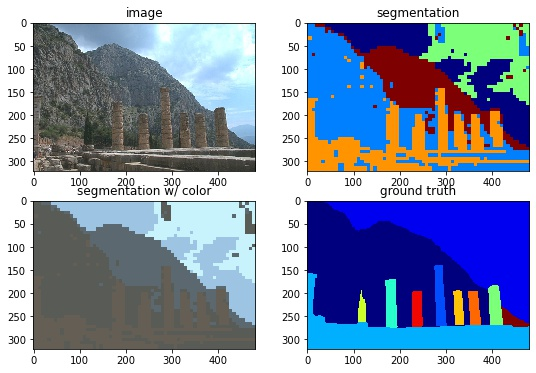

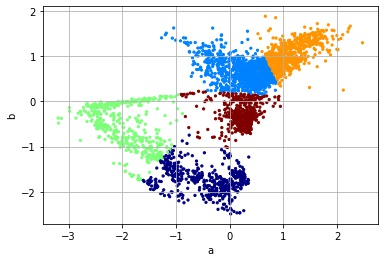

In [9]:
# calculate ARI
# convert cluster labels to a segmentation image
segm = labels2seg(kmeans.labels_, L)

# show the segmentation
showsegm(segm, img)

# show the scatter plot
showscatter(X,kmeans.labels_)

ari = metrics.adjusted_rand_score(gt.flatten(), segm.flatten())
print("ARI =",ari)

Let us iterate K-means and Gaussian Mixture Models with different cluster number to get the best segmentation as measured by ARI. 

In [10]:

from sklearn.model_selection import ParameterGrid

Ks  = [2, 3, 4, 5, 6, 7, 8, 9, 10]
models = [
   [cluster.KMeans(), {'n_clusters':Ks, 'random_state': [123]}], 
   [mixture.GaussianMixture(), {'n_components': Ks, 'covariance_type' : ['diag'], 'random_state' : [444]}],
 ]


results = []

for model in models:
    

    for params in list(ParameterGrid(model[1])): 
        curr_model = {}
        model[0].set_params(**params)
        model[0].fit(X)
        curr_model['name'] = type(model[0]).__name__
        
        curr_model['param'] = params       
        
        if type(model[0]).__name__ == 'KMeans':
            Ymodel = model[0].labels_
        else:
            Ymodel = model[0].predict(X)
        segm = labels2seg(Ymodel, L)
        curr_model['segm'] = segm
        curr_model['Y'] = Ymodel

        ari = metrics.adjusted_rand_score(gt.flatten(), segm.flatten())
        
        curr_model['ari'] = ari
        results.append(curr_model)
            


In [11]:
for L in results:   
    print(L['name'])
    print(L['param'])
    print(L['ari'])

KMeans
{'n_clusters': 2, 'random_state': 123}
0.44552986830567476
KMeans
{'n_clusters': 3, 'random_state': 123}
0.32627088108449454
KMeans
{'n_clusters': 4, 'random_state': 123}
0.5335057046337909
KMeans
{'n_clusters': 5, 'random_state': 123}
0.38257278765365466
KMeans
{'n_clusters': 6, 'random_state': 123}
0.33417482648986513
KMeans
{'n_clusters': 7, 'random_state': 123}
0.257730832969912
KMeans
{'n_clusters': 8, 'random_state': 123}
0.30273799502214893
KMeans
{'n_clusters': 9, 'random_state': 123}
0.2799849630746809
KMeans
{'n_clusters': 10, 'random_state': 123}
0.27018515690338984
GaussianMixture
{'covariance_type': 'diag', 'n_components': 2, 'random_state': 444}
0.3718445548235134
GaussianMixture
{'covariance_type': 'diag', 'n_components': 3, 'random_state': 444}
0.621165964213751
GaussianMixture
{'covariance_type': 'diag', 'n_components': 4, 'random_state': 444}
0.5335980122819557
GaussianMixture
{'covariance_type': 'diag', 'n_components': 5, 'random_state': 444}
0.340540300896206

----
KMeans
{'n_clusters': 2, 'random_state': 123}


<Figure size 432x288 with 0 Axes>

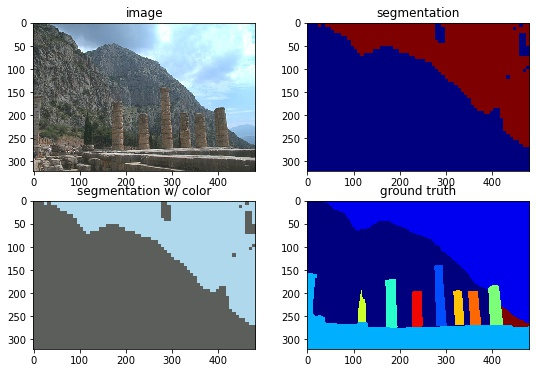

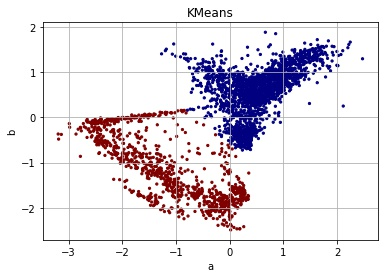

----
KMeans
{'n_clusters': 3, 'random_state': 123}


<Figure size 432x288 with 0 Axes>

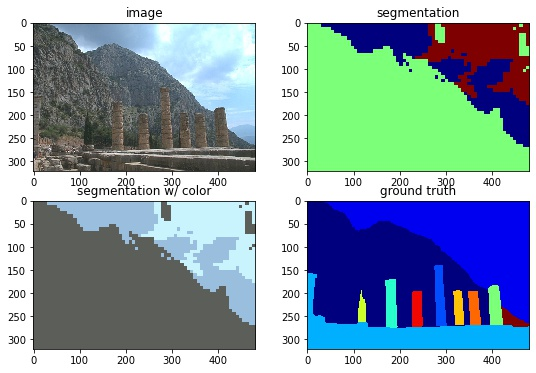

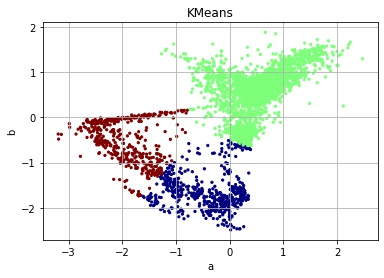

----
KMeans
{'n_clusters': 4, 'random_state': 123}


<Figure size 432x288 with 0 Axes>

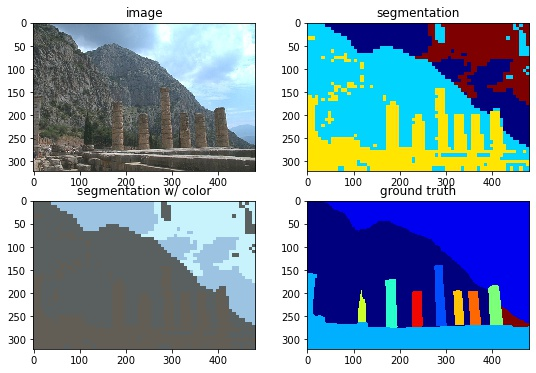

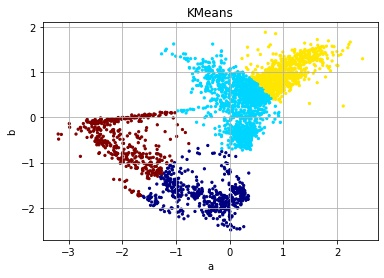

----
KMeans
{'n_clusters': 5, 'random_state': 123}


<Figure size 432x288 with 0 Axes>

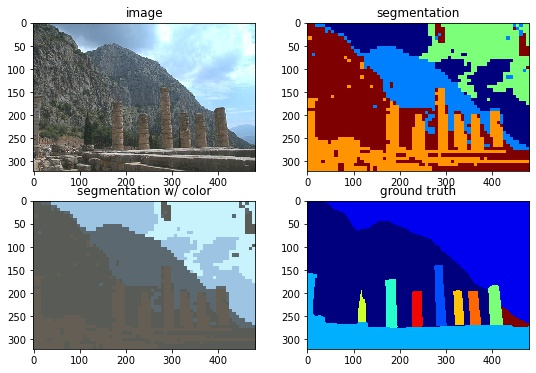

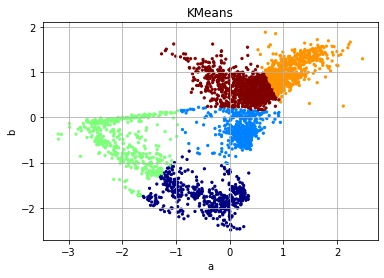

----
KMeans
{'n_clusters': 6, 'random_state': 123}


<Figure size 432x288 with 0 Axes>

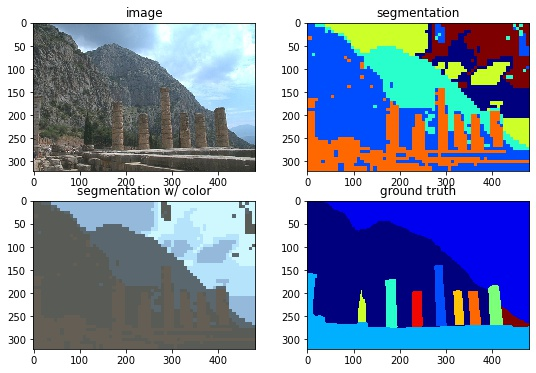

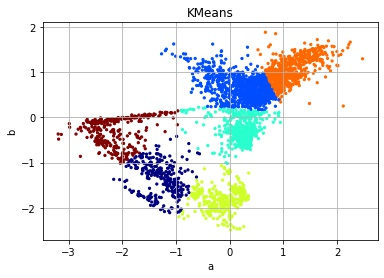

----
KMeans
{'n_clusters': 7, 'random_state': 123}


<Figure size 432x288 with 0 Axes>

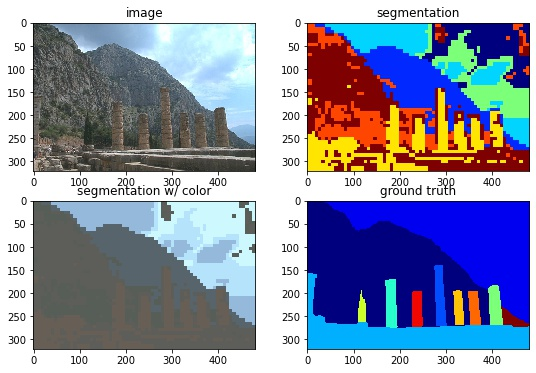

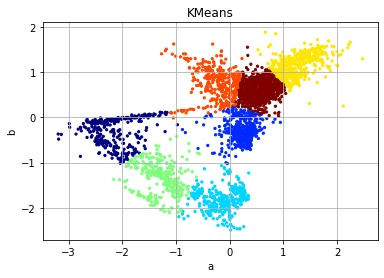

----
KMeans
{'n_clusters': 8, 'random_state': 123}


<Figure size 432x288 with 0 Axes>

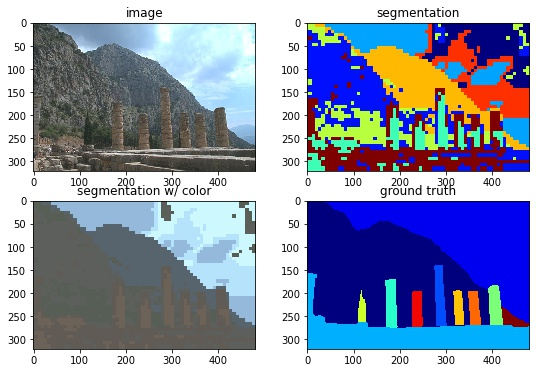

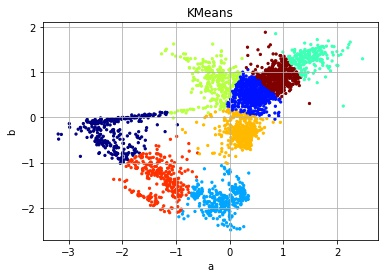

----
KMeans
{'n_clusters': 9, 'random_state': 123}


<Figure size 432x288 with 0 Axes>

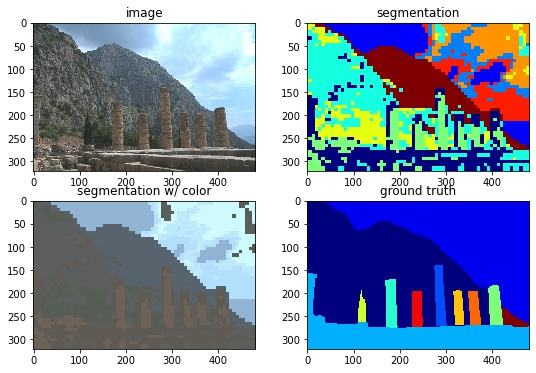

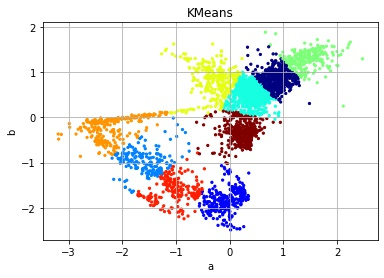

----
KMeans
{'n_clusters': 10, 'random_state': 123}


<Figure size 432x288 with 0 Axes>

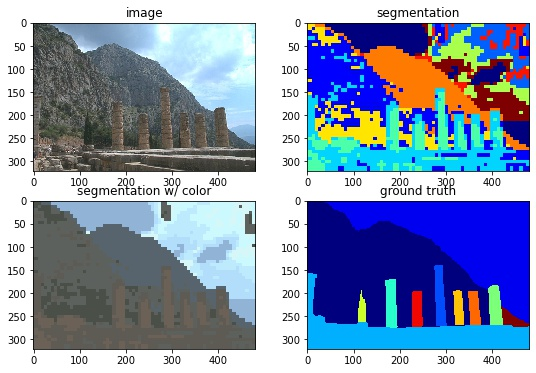

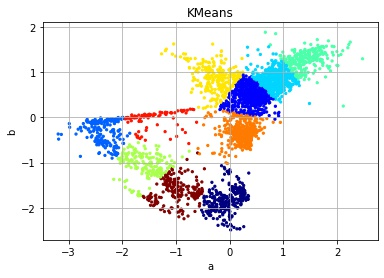

----
GaussianMixture
{'covariance_type': 'diag', 'n_components': 2, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

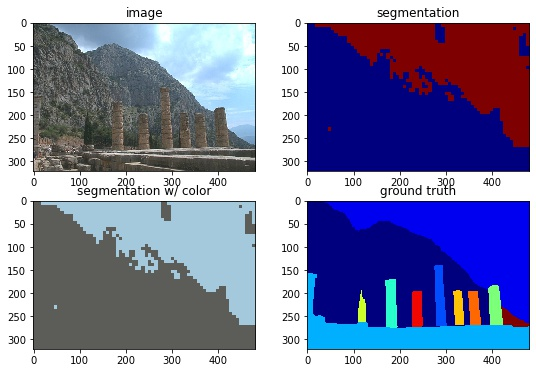

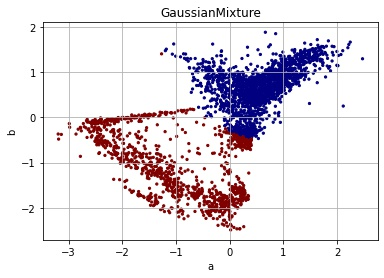

----
GaussianMixture
{'covariance_type': 'diag', 'n_components': 3, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

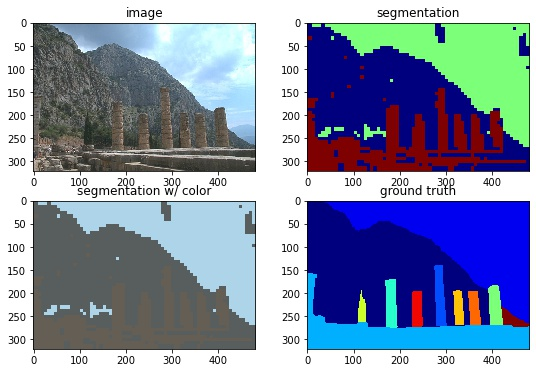

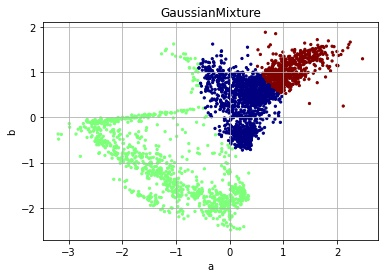

----
GaussianMixture
{'covariance_type': 'diag', 'n_components': 4, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

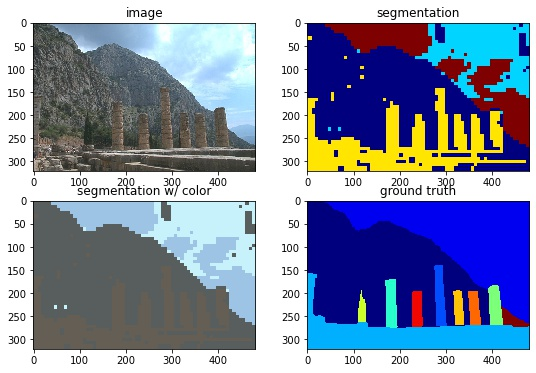

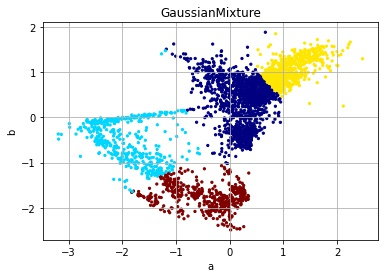

----
GaussianMixture
{'covariance_type': 'diag', 'n_components': 5, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

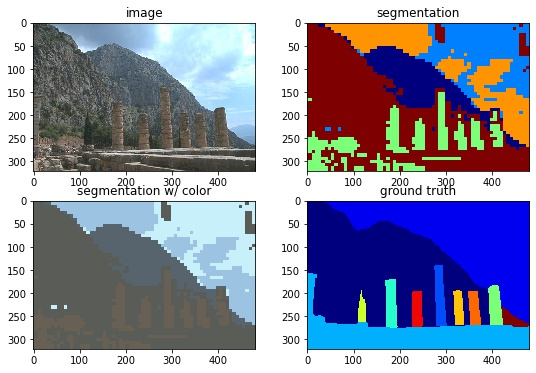

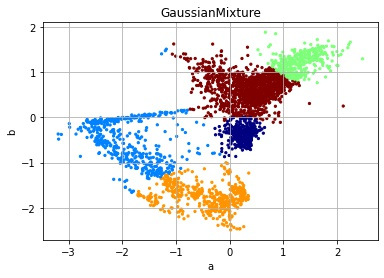

----
GaussianMixture
{'covariance_type': 'diag', 'n_components': 6, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

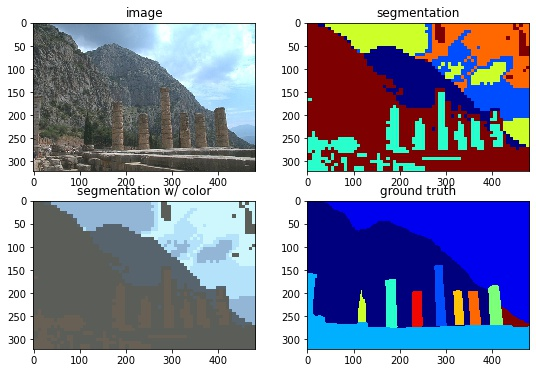

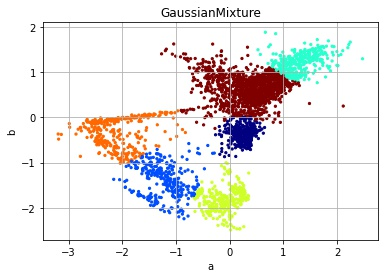

----
GaussianMixture
{'covariance_type': 'diag', 'n_components': 7, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

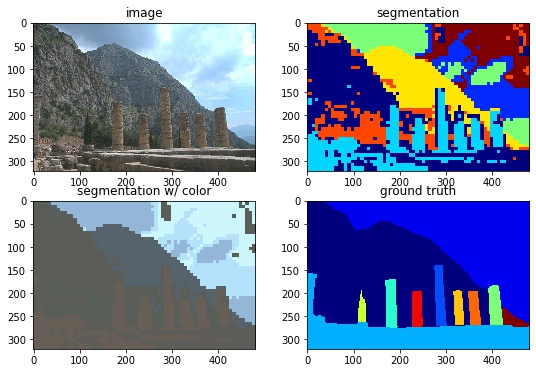

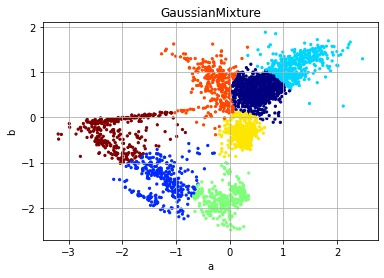

----
GaussianMixture
{'covariance_type': 'diag', 'n_components': 8, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

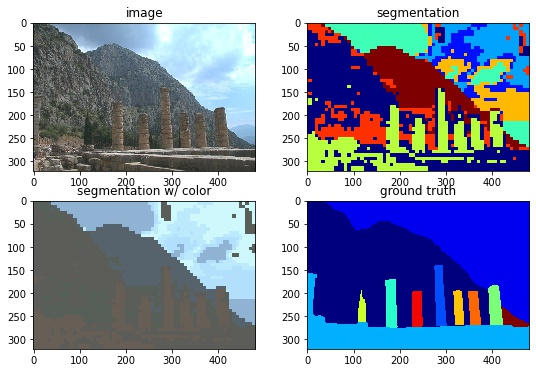

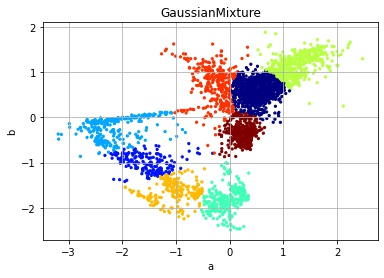

----
GaussianMixture
{'covariance_type': 'diag', 'n_components': 9, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

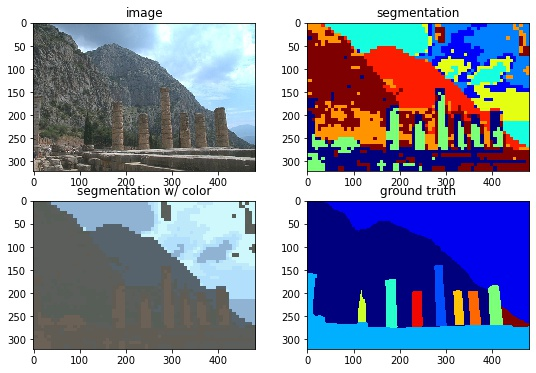

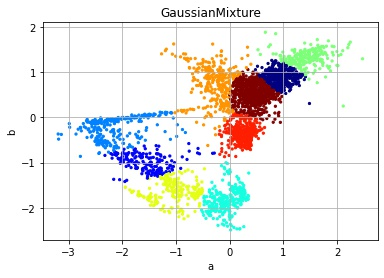

----
GaussianMixture
{'covariance_type': 'diag', 'n_components': 10, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

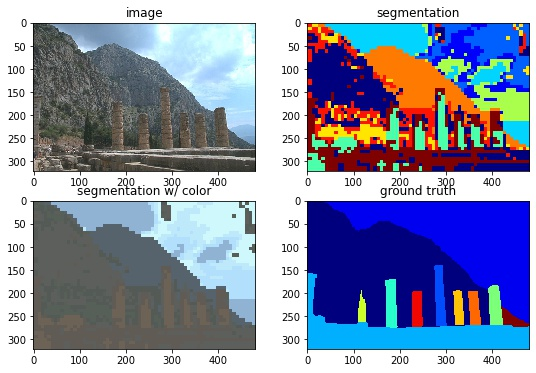

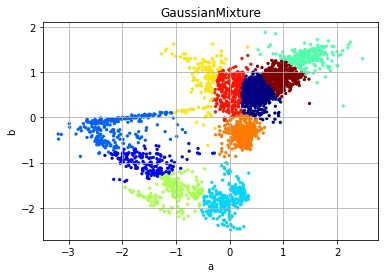

In [12]:
for L in results:   
    print('----')
    print(L['name'])
    print(L['param'])

    plt.figure()
    # show the segmentation
    showsegm(L['segm'], img)

    # show the scatter plot
    showscatter(X,L['Y'])
    plt.title(L['name'])
    plt.show()

In [27]:
for top5 in sortedResults[-5:]:
    print(f'Name: {top5["name"]} -- Params: {top5["param"]} -- ARI: {top5["ari"]}')

Name: KMeans -- Params: {'n_clusters': 5, 'random_state': 123} -- ARI: 0.38257278765365466
Name: KMeans -- Params: {'n_clusters': 2, 'random_state': 123} -- ARI: 0.44552986830567476
Name: KMeans -- Params: {'n_clusters': 4, 'random_state': 123} -- ARI: 0.5335057046337909
Name: GaussianMixture -- Params: {'covariance_type': 'diag', 'n_components': 4, 'random_state': 444} -- ARI: 0.5335980122819557
Name: GaussianMixture -- Params: {'covariance_type': 'diag', 'n_components': 3, 'random_state': 444} -- ARI: 0.621165964213751


------
KMeans
{'n_clusters': 5, 'random_state': 123}


<Figure size 432x288 with 0 Axes>

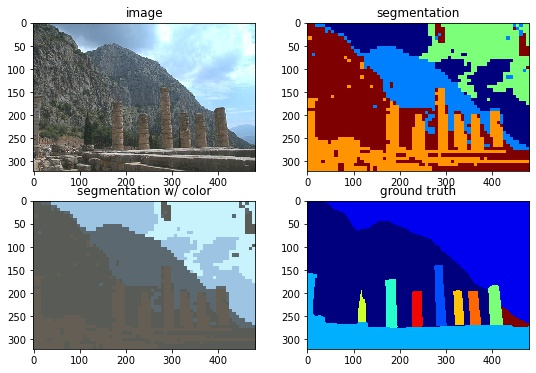

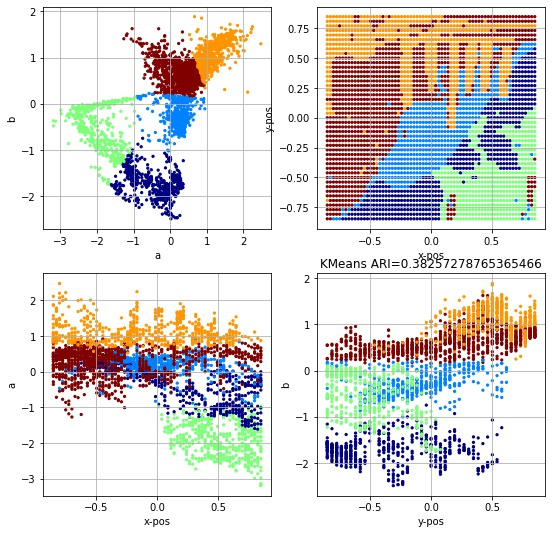

------

------
KMeans
{'n_clusters': 2, 'random_state': 123}


<Figure size 432x288 with 0 Axes>

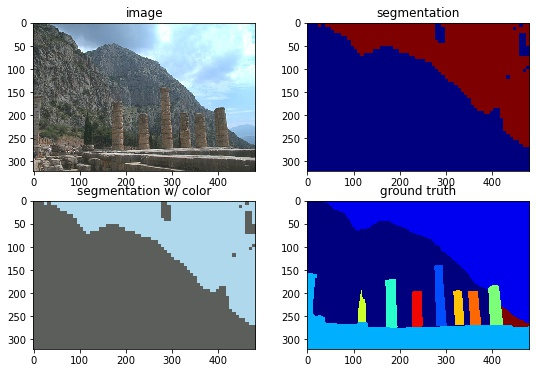

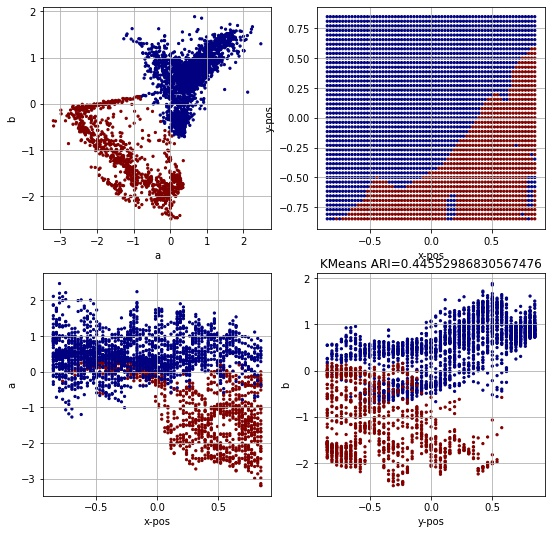

------

------
KMeans
{'n_clusters': 4, 'random_state': 123}


<Figure size 432x288 with 0 Axes>

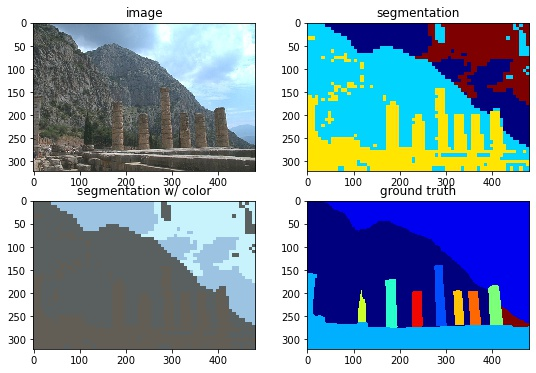

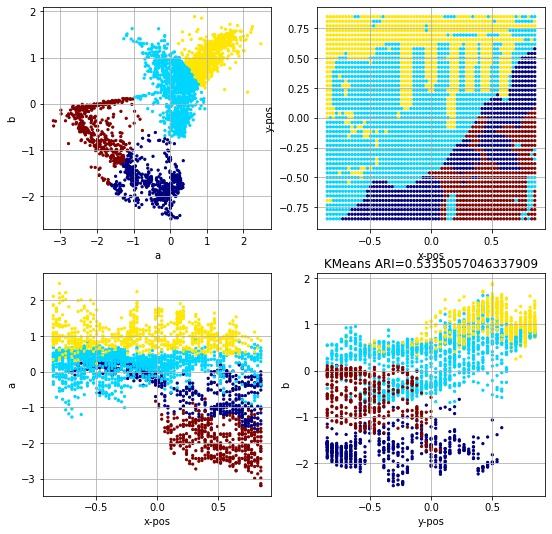

------

------
GaussianMixture
{'covariance_type': 'diag', 'n_components': 4, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

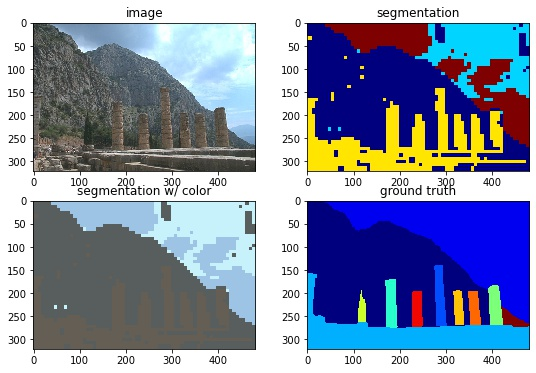

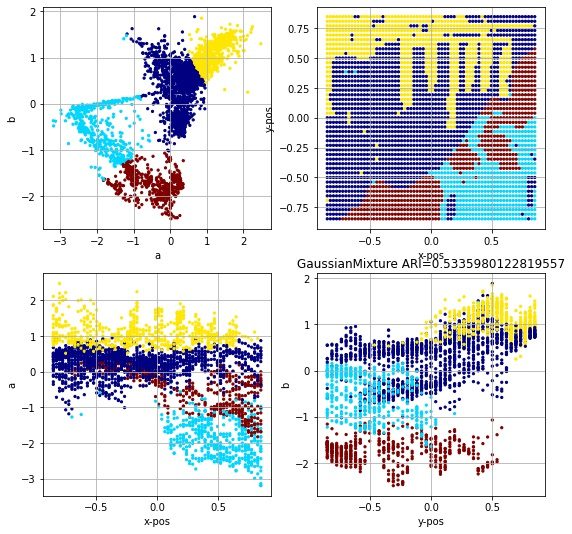

------

------
GaussianMixture
{'covariance_type': 'diag', 'n_components': 3, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

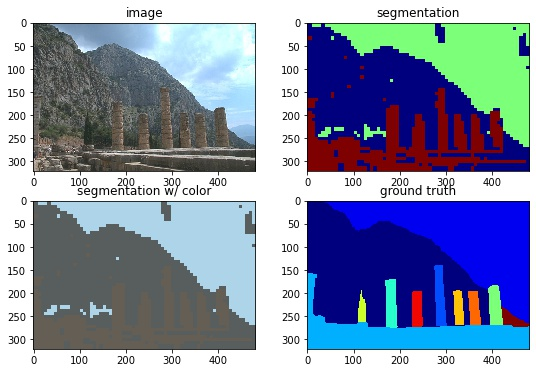

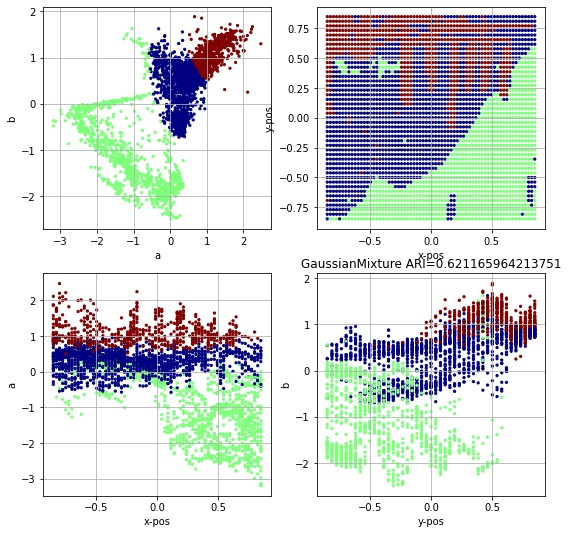

------



In [22]:
from operator import itemgetter
sortedResults = sorted(results, key=itemgetter('ari'))
for L in sortedResults[-5:]:
    print('------')
    print(L['name'])
    print(L['param'])
    plt.figure()
    # show the segmentation
    showsegm(L['segm'], img)

    # show the scatter plot
    showscatter(X,L['Y'])
    plt.title(L['name'] + " ARI=" + str(L['ari']))
    plt.show()
    print('------\n')

## 3. Color and Position Features
You may notice that the segmentation is not spatially smooth. There are some "loner" pixels that are not the same cluster as the surrounding pixels.  This is because we are only clustering color.  One way to fix this is to include the (x,y) coordinate of the pixel as part of the feature vector.  This way, clusters will have pixels that are spatially close together.

The below code extracts a 4-dimensional feature vector, where the first 2 features are the color channels and the last 2 features are the position.

Here are plots of the 4 features.

(3060, 4)


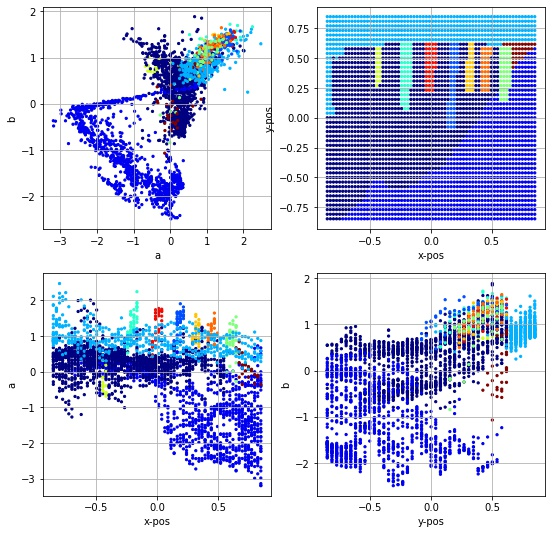

In [13]:
# extract features with location
Xo,Ytrue,L = getfeatures(img, gt, use_loc=True)
print(Xo.shape)

# normalize features
scaler = preprocessing.StandardScaler()  
X = scaler.fit_transform(Xo)

# rescale position features
# larger values emphasize clustering by position more
X[:,2:4] *= 0.5

showscatter(X, Ytrue)

Run clustering algorithms on the 4-dimensional data.  Try different algorithms and parameters to get the best ARI.

In [14]:
models = [
   [cluster.KMeans(), {'n_clusters':Ks, 'random_state': [123]}], 
   [mixture.GaussianMixture(), {'n_components': Ks, 'covariance_type' : ['diag', 'tied', 'spherical'], 'random_state' : [444]}],
 ]
results2 = []

for model in models:

    for params in list(ParameterGrid(model[1])): 
        curr_model = {}
        model[0].set_params(**params)
        model[0].fit(X)
        curr_model['name'] = type(model[0]).__name__
        
        curr_model['param'] = params       
        
        if type(model[0]).__name__ == 'KMeans':
            Ymodel = model[0].labels_
        else:
            Ymodel = model[0].predict(X)
        segm = labels2seg(Ymodel, L)
        curr_model['segm'] = segm
        curr_model['Y'] = Ymodel

        ari = metrics.adjusted_rand_score(gt.flatten(), segm.flatten())
        
        curr_model['ari'] = ari
        results2.append(curr_model)


In [15]:
for L in results2:
    print(L['name'])
    print(L['param'])
    print(L['ari'])

KMeans
{'n_clusters': 2, 'random_state': 123}
0.4448981957389039
KMeans
{'n_clusters': 3, 'random_state': 123}
0.24398156848328997
KMeans
{'n_clusters': 4, 'random_state': 123}
0.6037546695140711
KMeans
{'n_clusters': 5, 'random_state': 123}
0.44408312152015694
KMeans
{'n_clusters': 6, 'random_state': 123}
0.39751520420102027
KMeans
{'n_clusters': 7, 'random_state': 123}
0.3250044023829712
KMeans
{'n_clusters': 8, 'random_state': 123}
0.3149137410681481
KMeans
{'n_clusters': 9, 'random_state': 123}
0.2887133914808141
KMeans
{'n_clusters': 10, 'random_state': 123}
0.2730025472216162
GaussianMixture
{'covariance_type': 'diag', 'n_components': 2, 'random_state': 444}
0.3365620250324674
GaussianMixture
{'covariance_type': 'diag', 'n_components': 3, 'random_state': 444}
0.404809805151716
GaussianMixture
{'covariance_type': 'diag', 'n_components': 4, 'random_state': 444}
0.4713637203481415
GaussianMixture
{'covariance_type': 'diag', 'n_components': 5, 'random_state': 444}
0.43011435995192787

------
KMeans
{'n_clusters': 2, 'random_state': 123}


<Figure size 432x288 with 0 Axes>

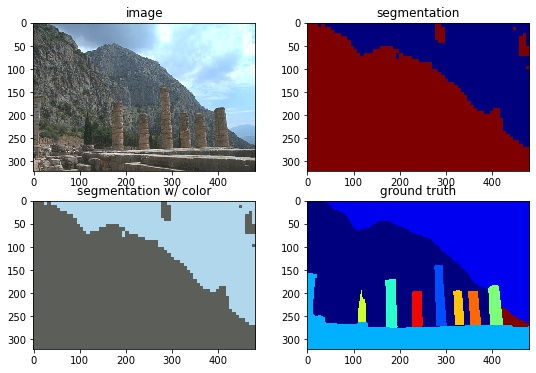

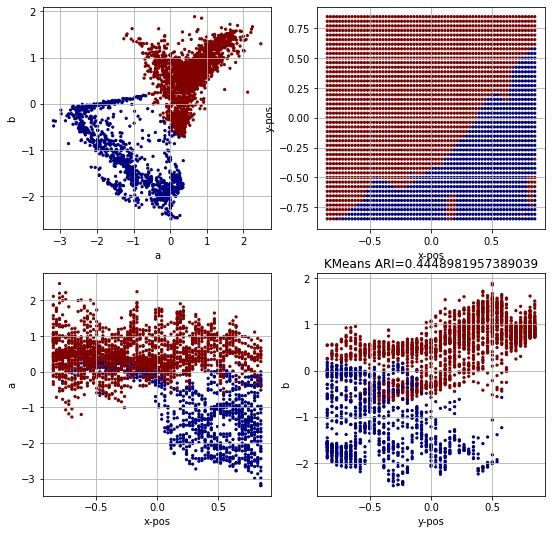

------

------
KMeans
{'n_clusters': 3, 'random_state': 123}


<Figure size 432x288 with 0 Axes>

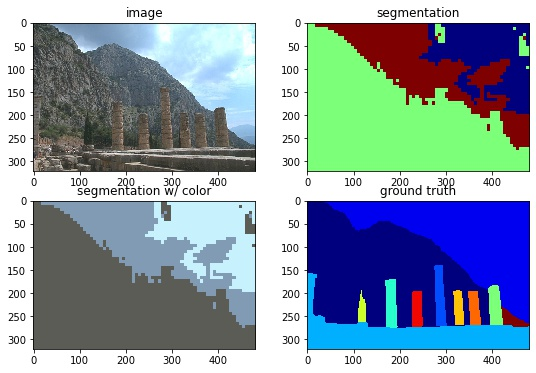

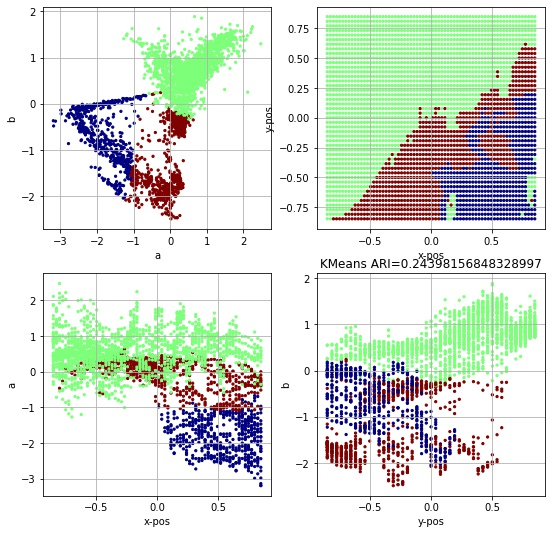

------

------
KMeans
{'n_clusters': 4, 'random_state': 123}


<Figure size 432x288 with 0 Axes>

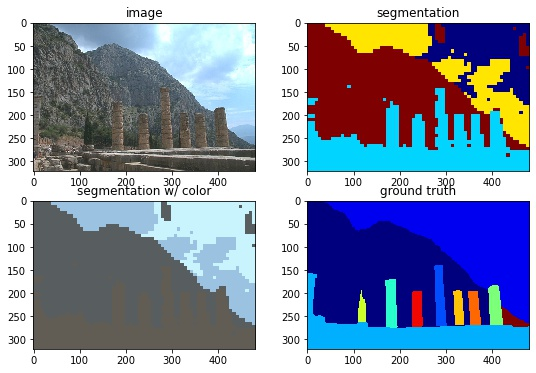

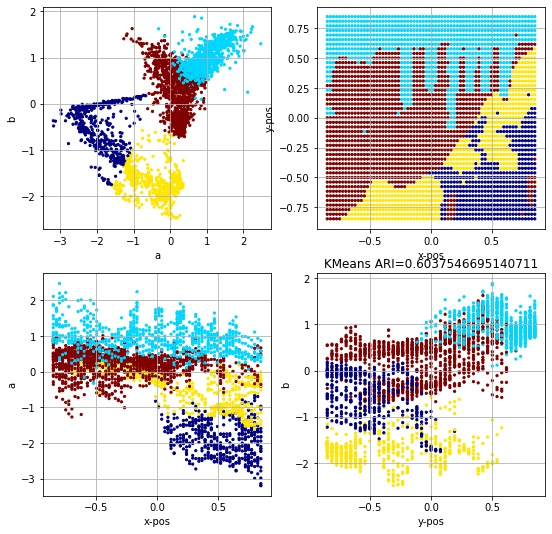

------

------
KMeans
{'n_clusters': 5, 'random_state': 123}


<Figure size 432x288 with 0 Axes>

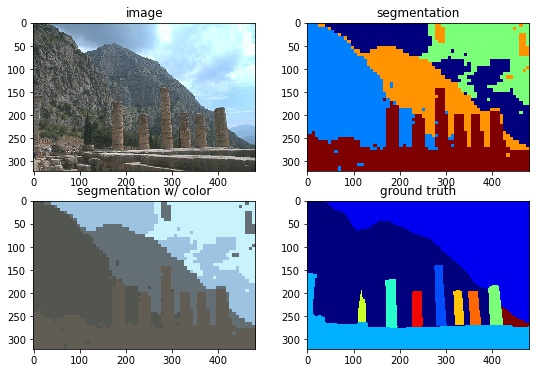

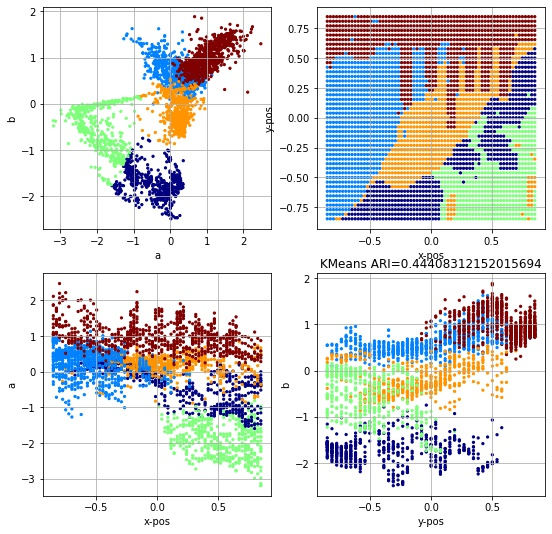

------

------
KMeans
{'n_clusters': 6, 'random_state': 123}


<Figure size 432x288 with 0 Axes>

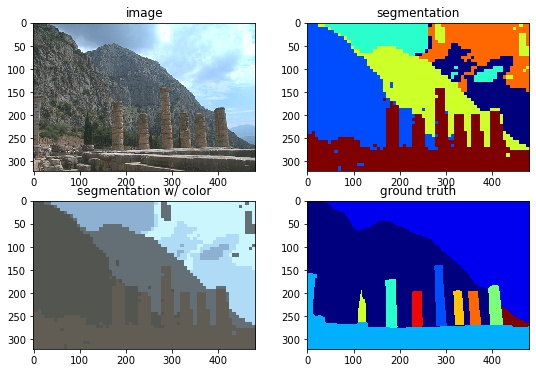

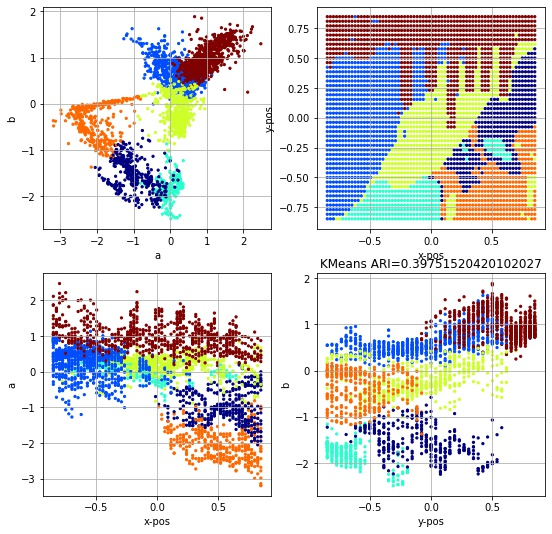

------

------
KMeans
{'n_clusters': 7, 'random_state': 123}


<Figure size 432x288 with 0 Axes>

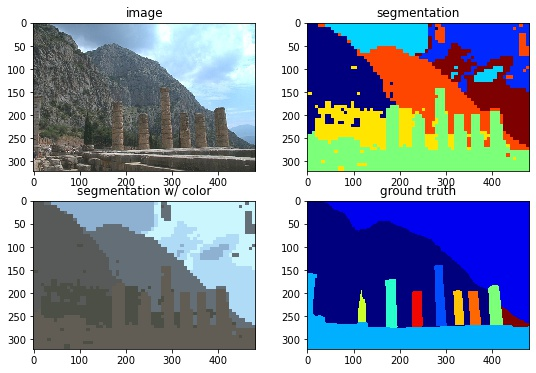

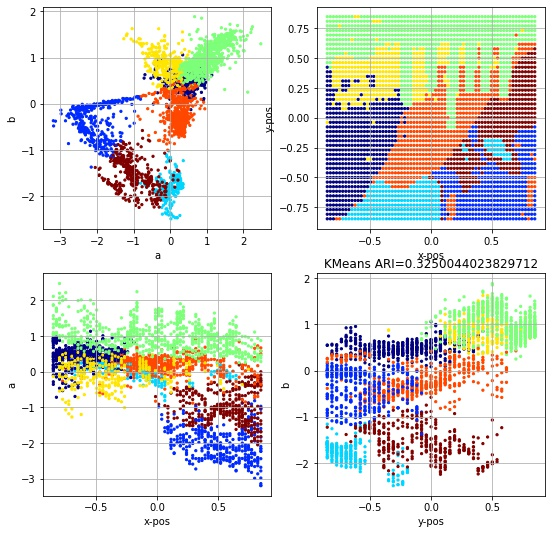

------

------
KMeans
{'n_clusters': 8, 'random_state': 123}


<Figure size 432x288 with 0 Axes>

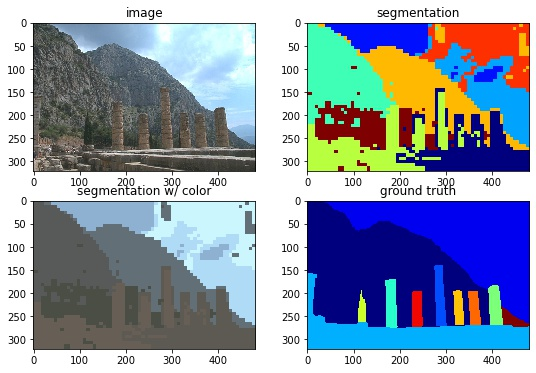

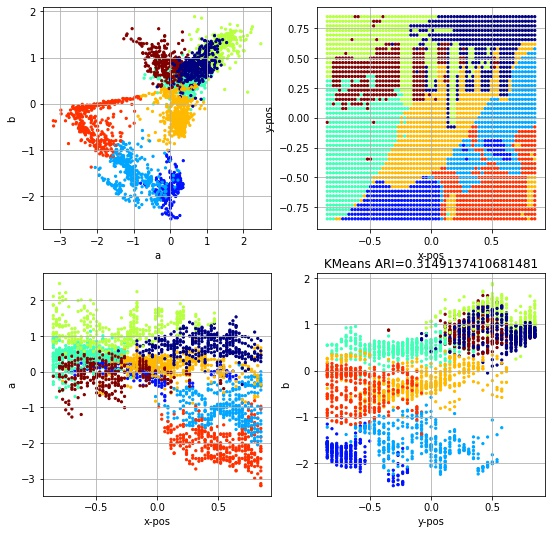

------

------
KMeans
{'n_clusters': 9, 'random_state': 123}


<Figure size 432x288 with 0 Axes>

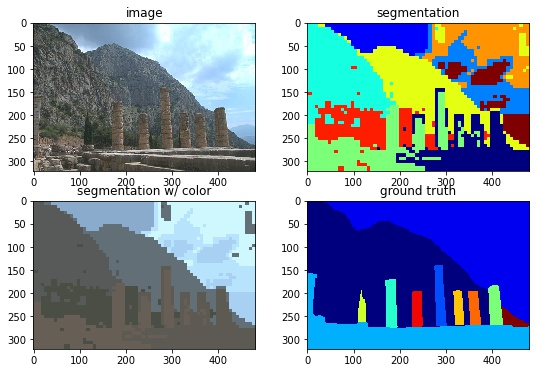

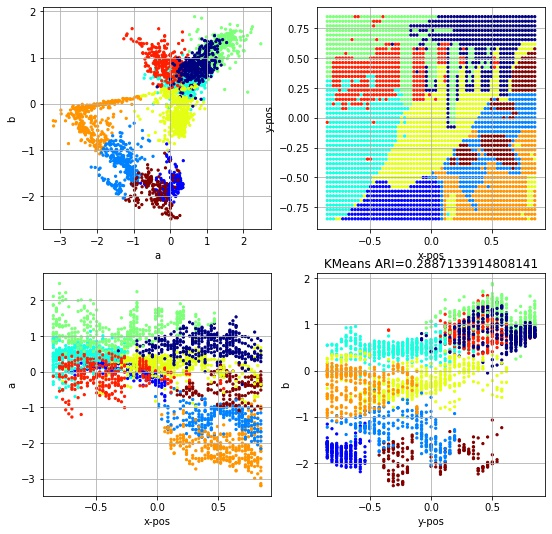

------

------
KMeans
{'n_clusters': 10, 'random_state': 123}


<Figure size 432x288 with 0 Axes>

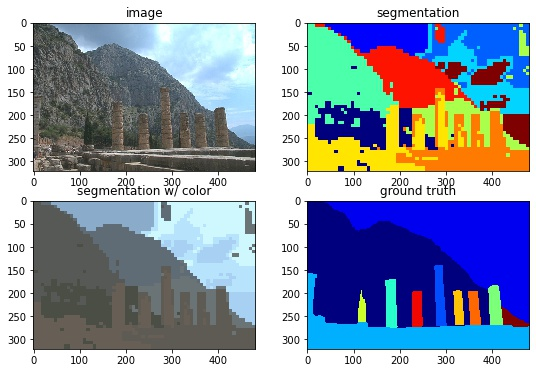

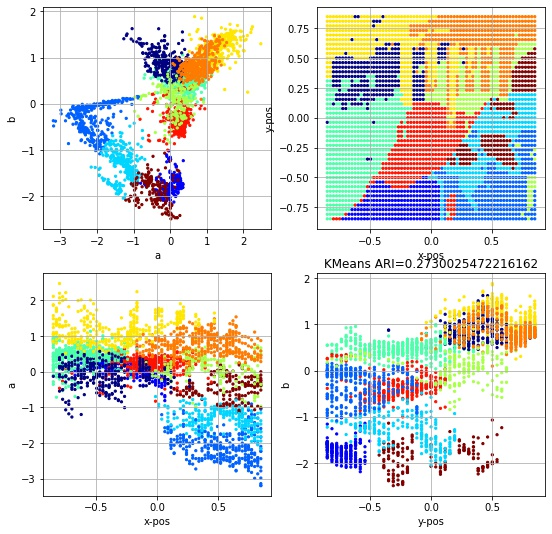

------

------
GaussianMixture
{'covariance_type': 'diag', 'n_components': 2, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

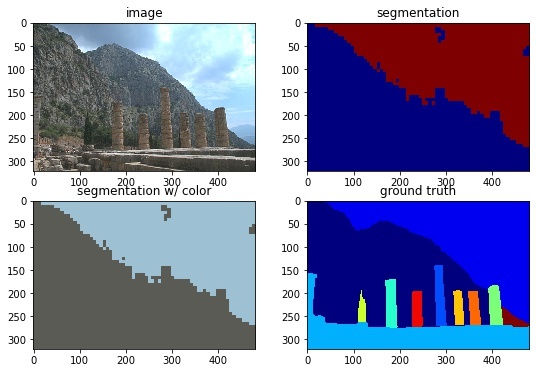

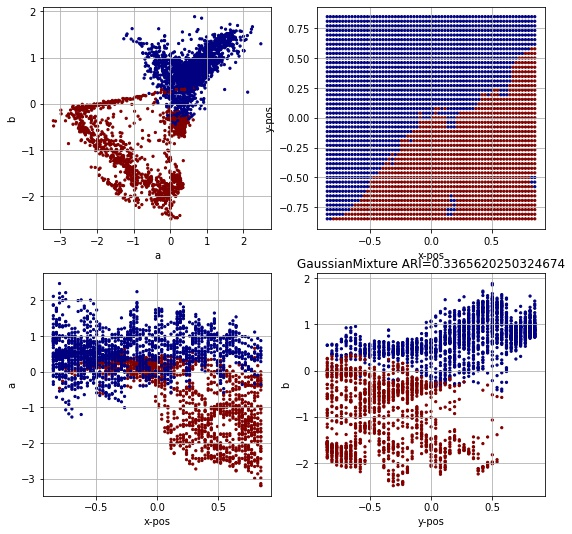

------

------
GaussianMixture
{'covariance_type': 'diag', 'n_components': 3, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

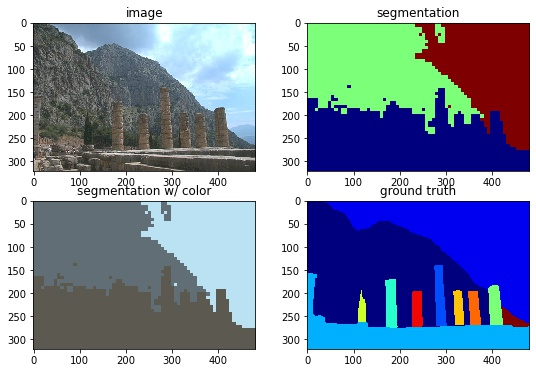

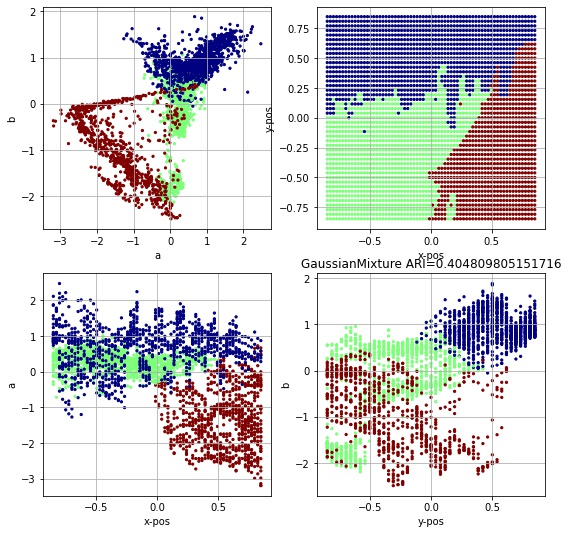

------

------
GaussianMixture
{'covariance_type': 'diag', 'n_components': 4, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

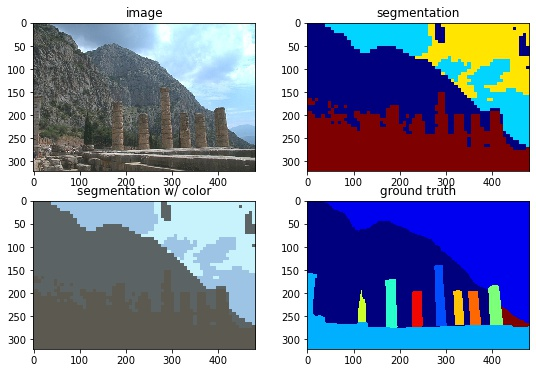

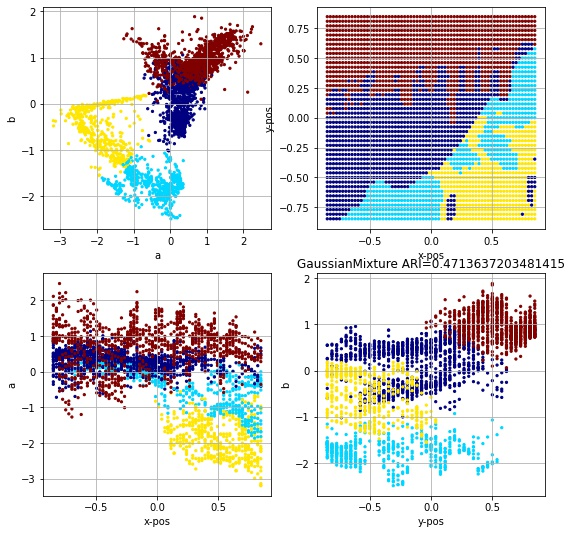

------

------
GaussianMixture
{'covariance_type': 'diag', 'n_components': 5, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

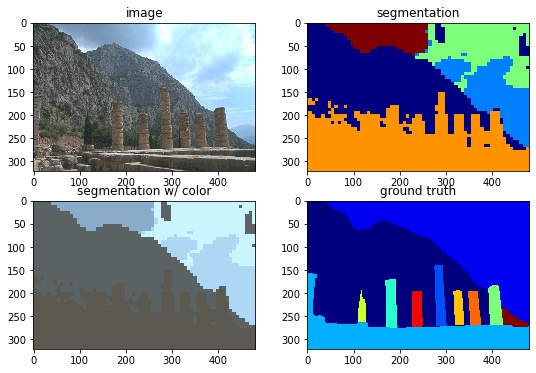

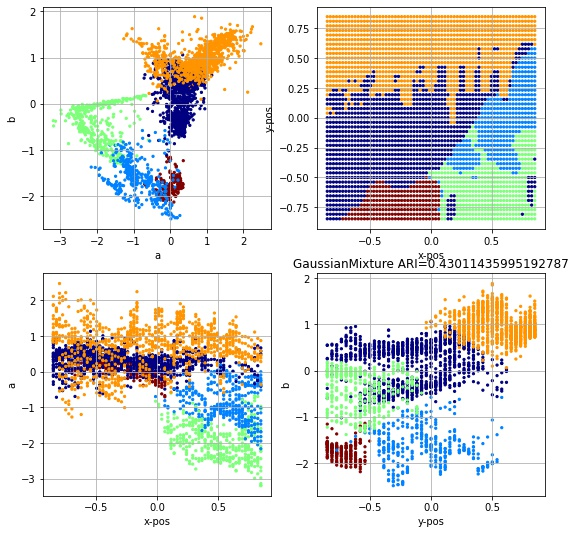

------

------
GaussianMixture
{'covariance_type': 'diag', 'n_components': 6, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

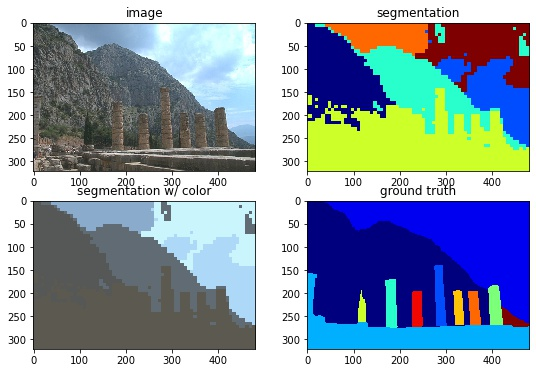

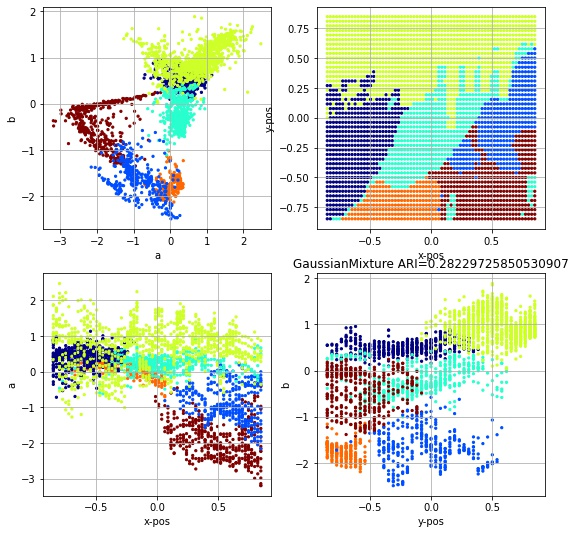

------

------
GaussianMixture
{'covariance_type': 'diag', 'n_components': 7, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

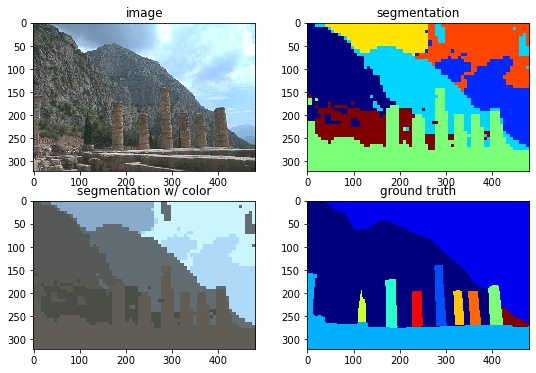

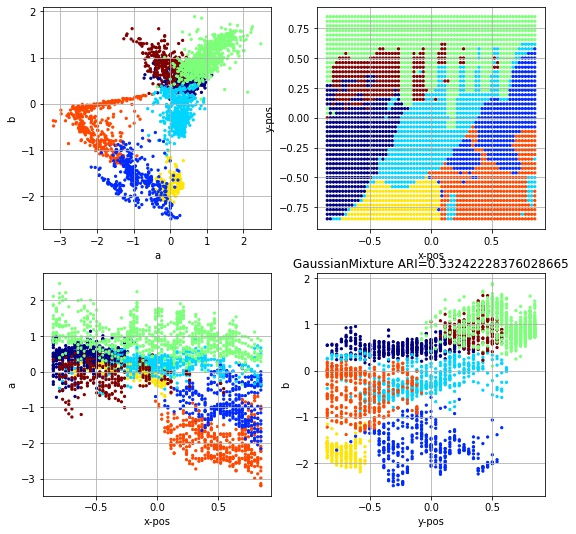

------

------
GaussianMixture
{'covariance_type': 'diag', 'n_components': 8, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

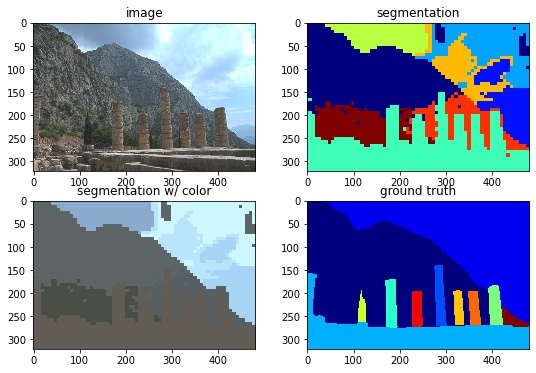

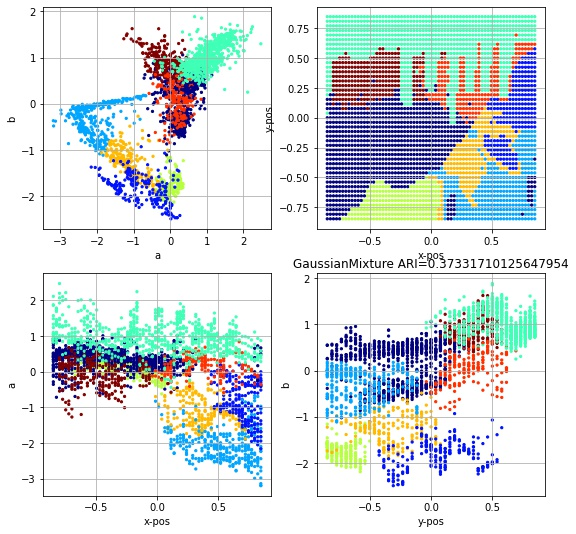

------

------
GaussianMixture
{'covariance_type': 'diag', 'n_components': 9, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

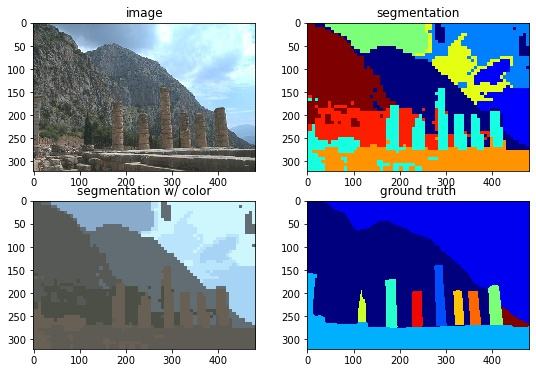

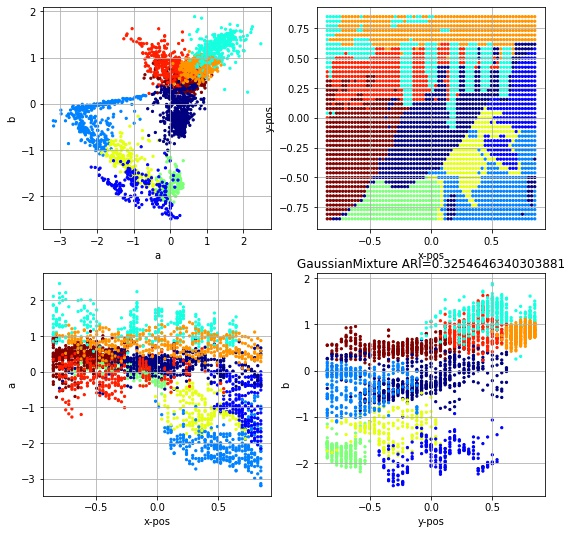

------

------
GaussianMixture
{'covariance_type': 'diag', 'n_components': 10, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

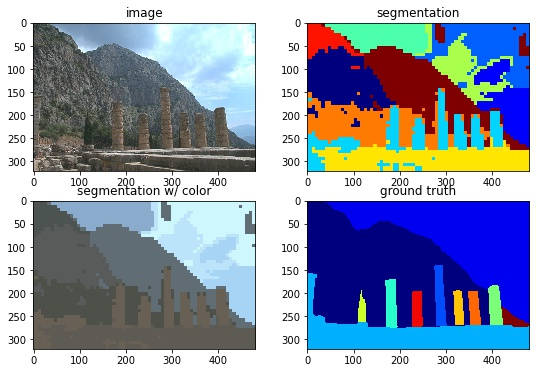

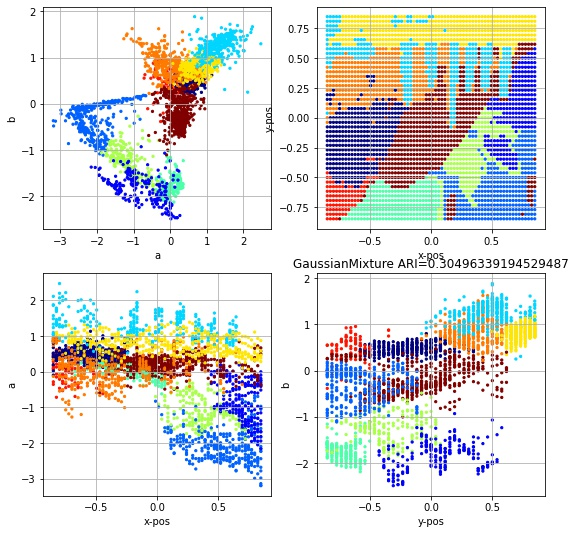

------

------
GaussianMixture
{'covariance_type': 'tied', 'n_components': 2, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

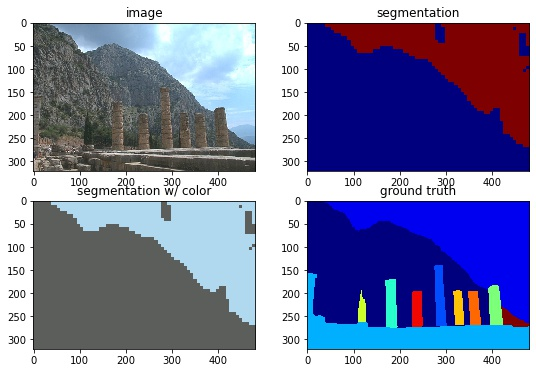

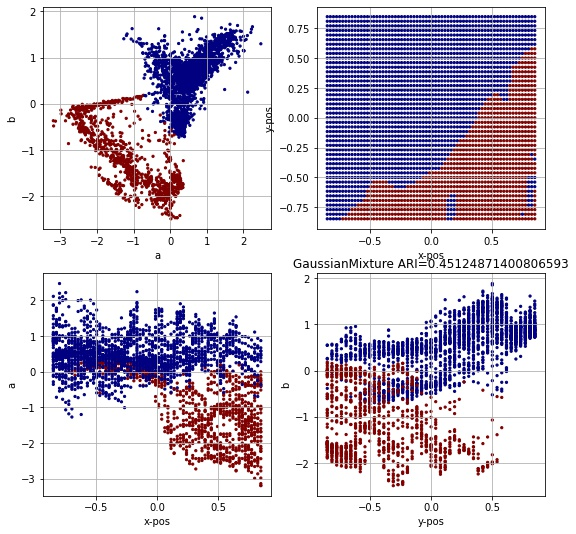

------

------
GaussianMixture
{'covariance_type': 'tied', 'n_components': 3, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

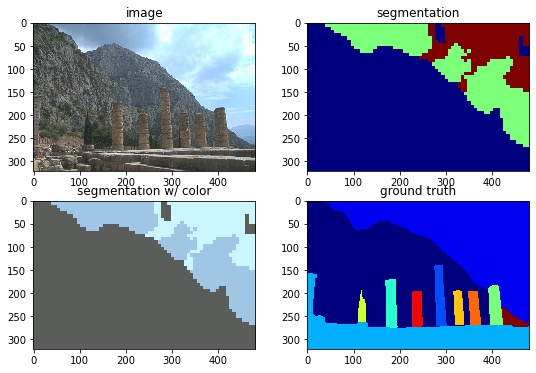

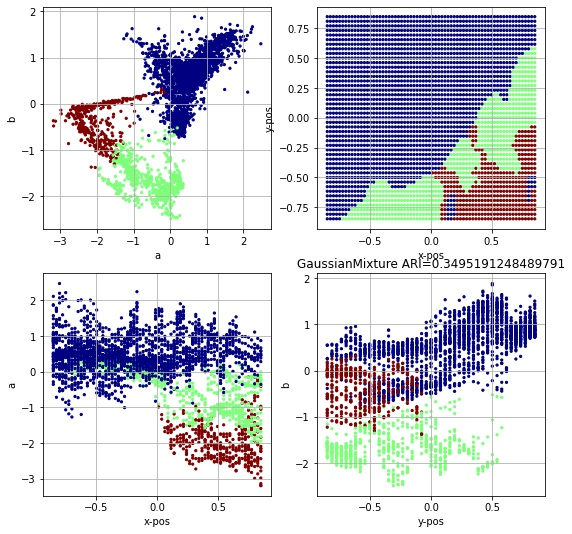

------

------
GaussianMixture
{'covariance_type': 'tied', 'n_components': 4, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

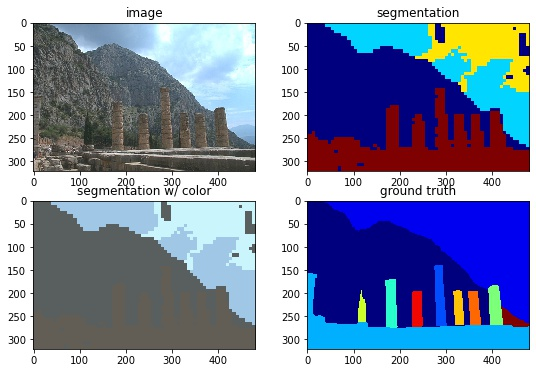

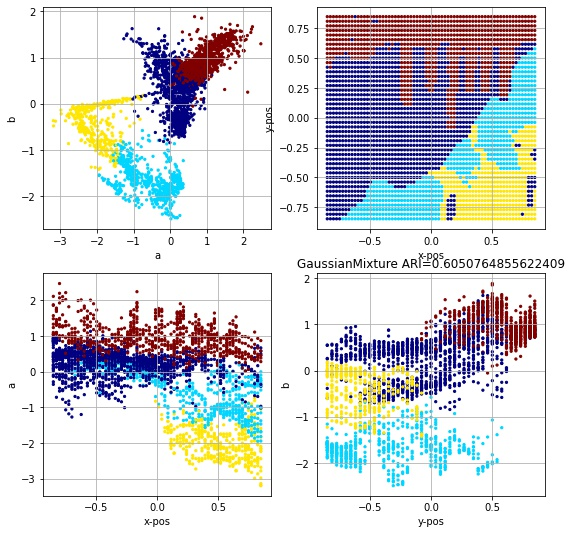

------

------
GaussianMixture
{'covariance_type': 'tied', 'n_components': 5, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

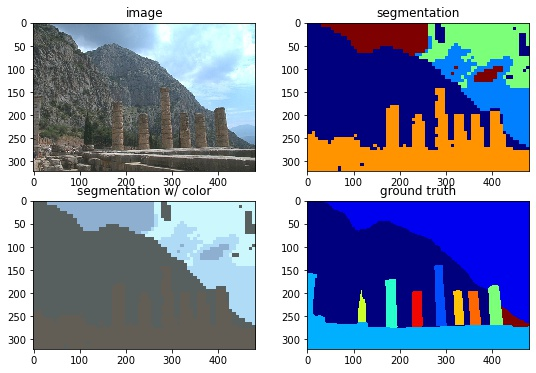

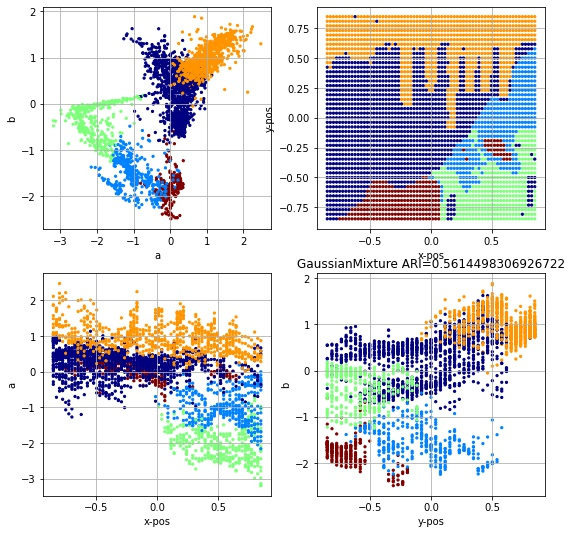

------

------
GaussianMixture
{'covariance_type': 'tied', 'n_components': 6, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

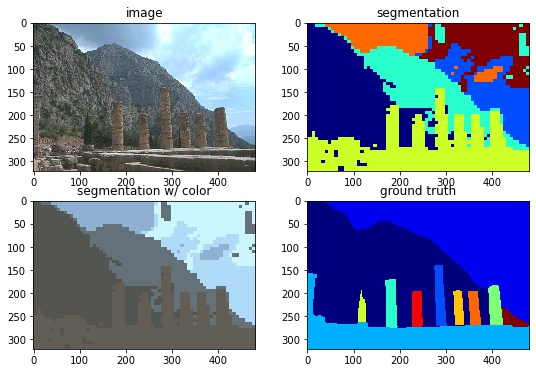

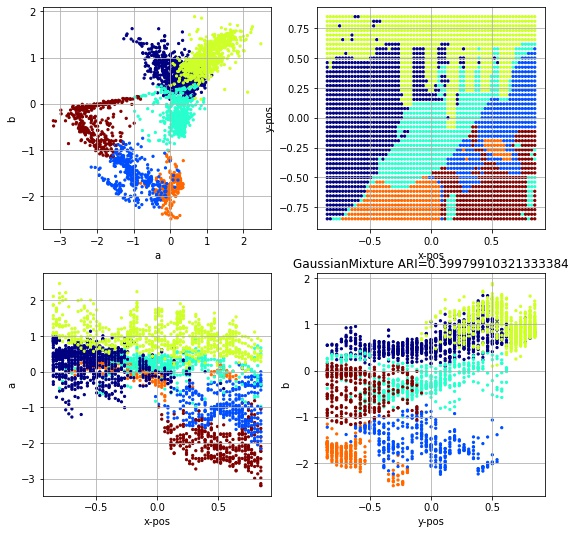

------

------
GaussianMixture
{'covariance_type': 'tied', 'n_components': 7, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

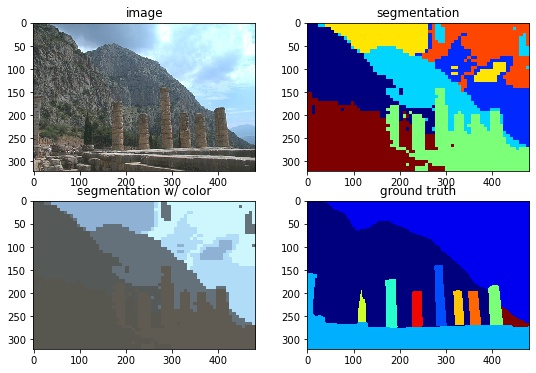

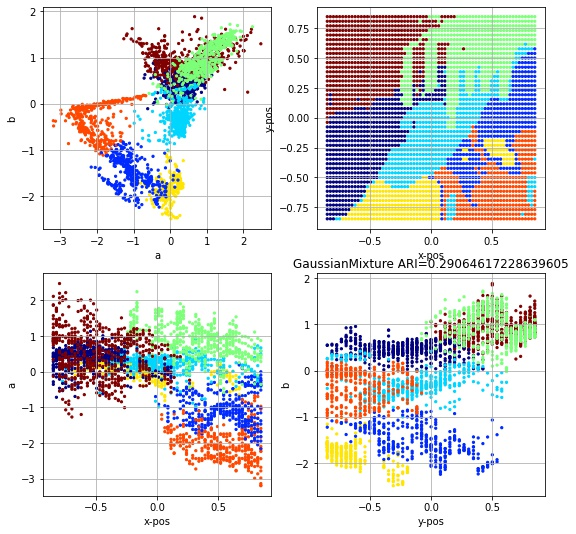

------

------
GaussianMixture
{'covariance_type': 'tied', 'n_components': 8, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

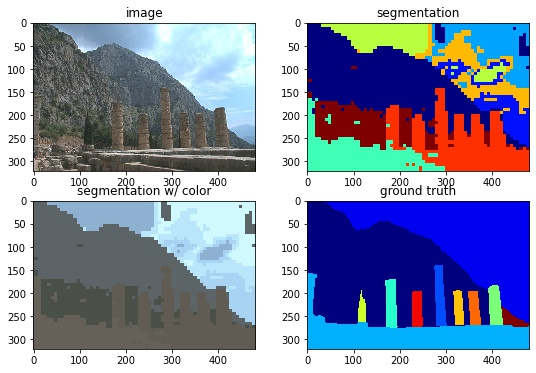

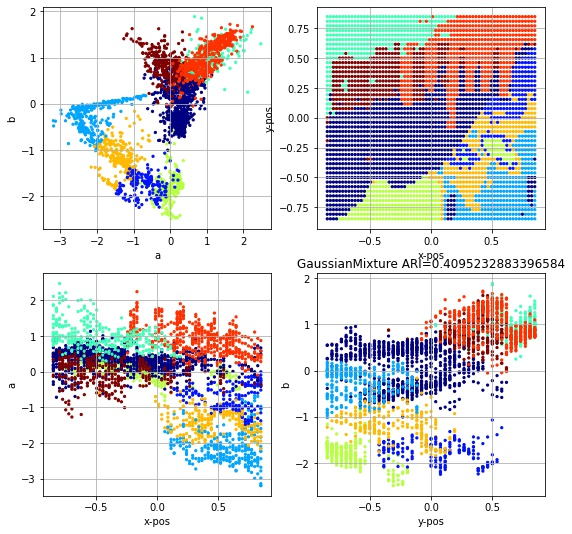

------

------
GaussianMixture
{'covariance_type': 'tied', 'n_components': 9, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

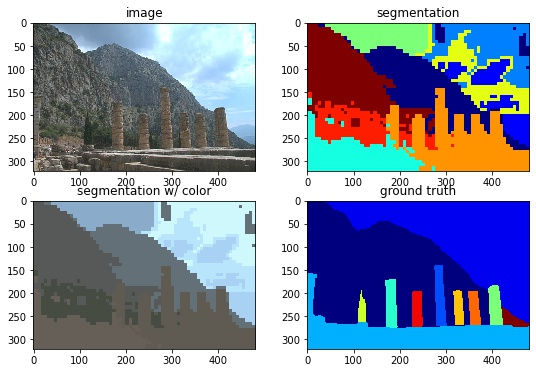

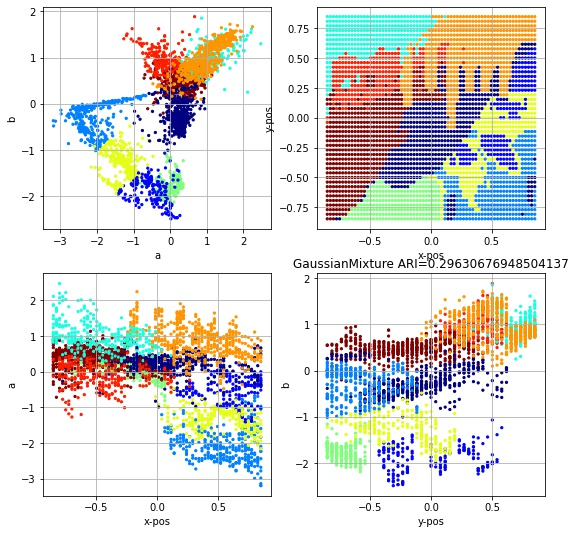

------

------
GaussianMixture
{'covariance_type': 'tied', 'n_components': 10, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

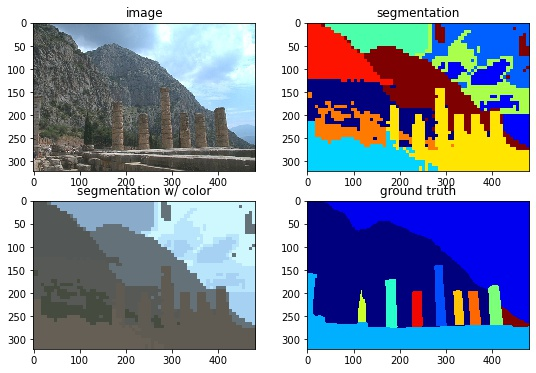

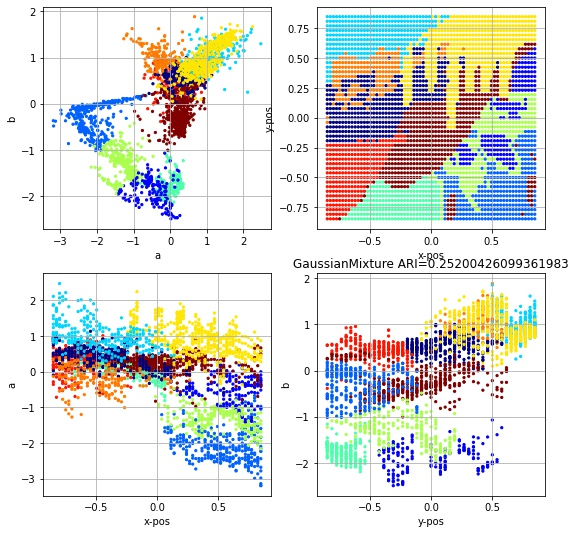

------

------
GaussianMixture
{'covariance_type': 'spherical', 'n_components': 2, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

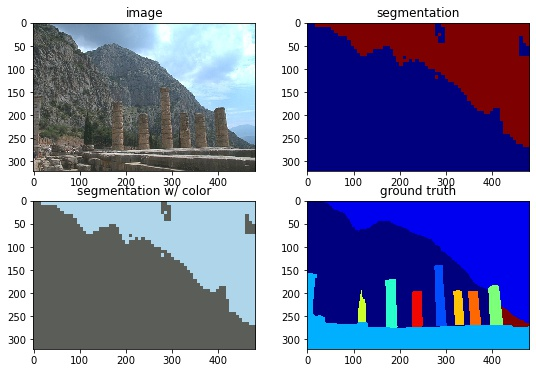

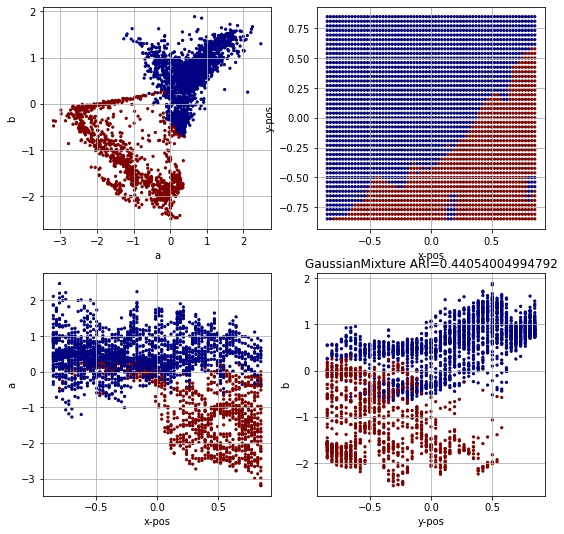

------

------
GaussianMixture
{'covariance_type': 'spherical', 'n_components': 3, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

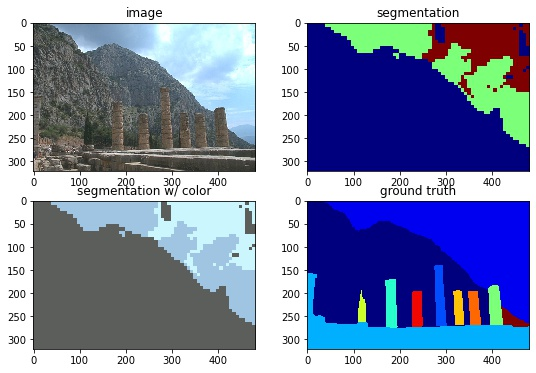

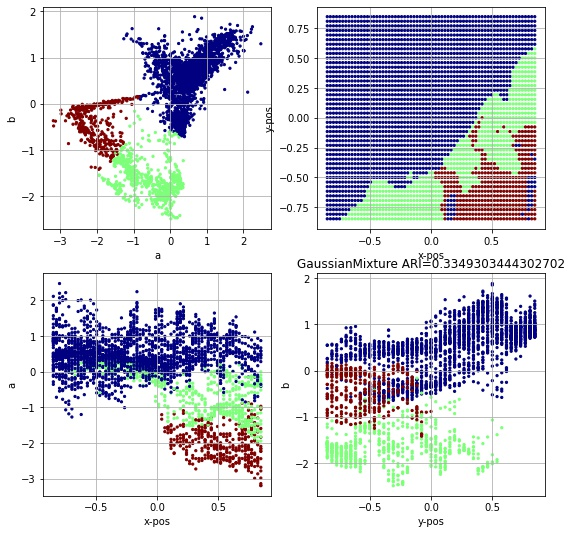

------

------
GaussianMixture
{'covariance_type': 'spherical', 'n_components': 4, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

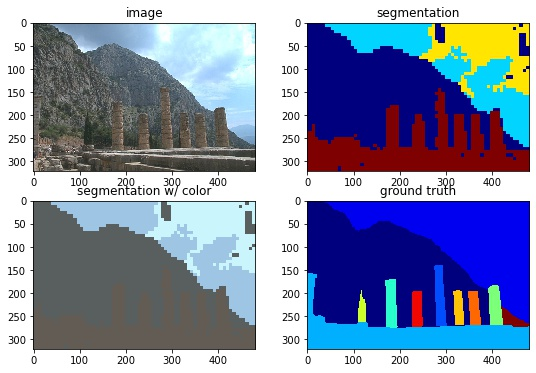

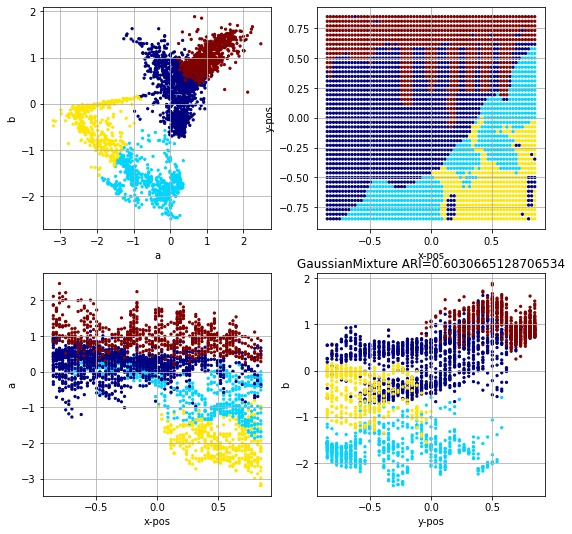

------

------
GaussianMixture
{'covariance_type': 'spherical', 'n_components': 5, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

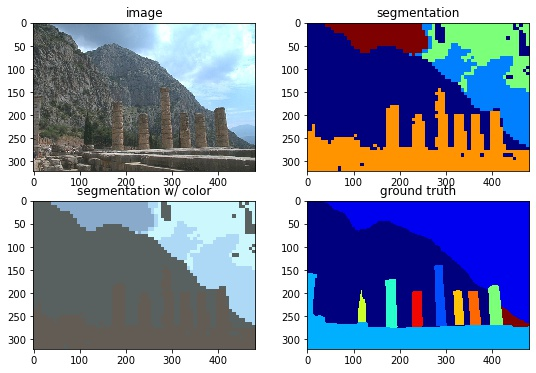

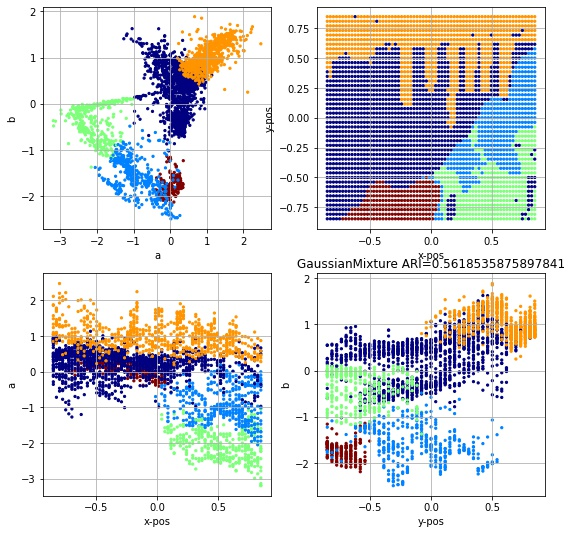

------

------
GaussianMixture
{'covariance_type': 'spherical', 'n_components': 6, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

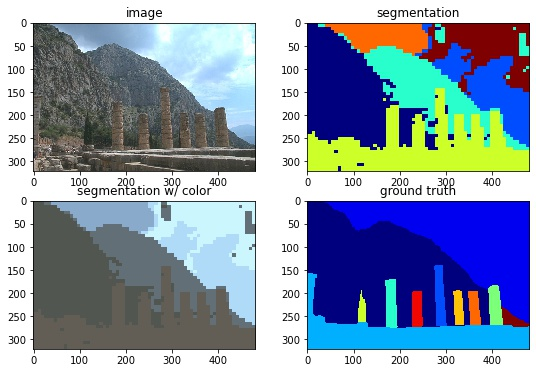

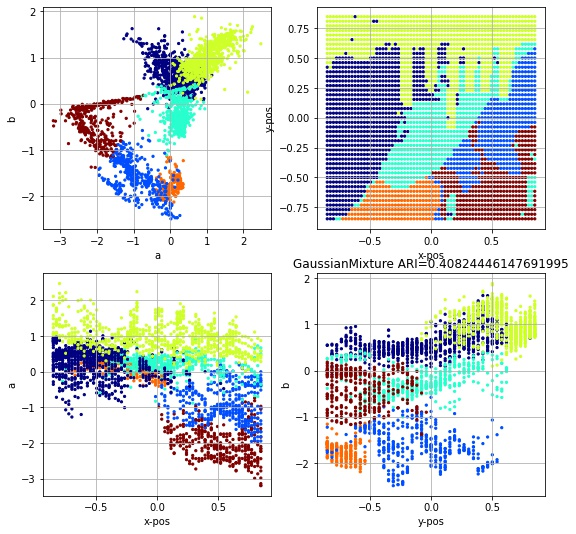

------

------
GaussianMixture
{'covariance_type': 'spherical', 'n_components': 7, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

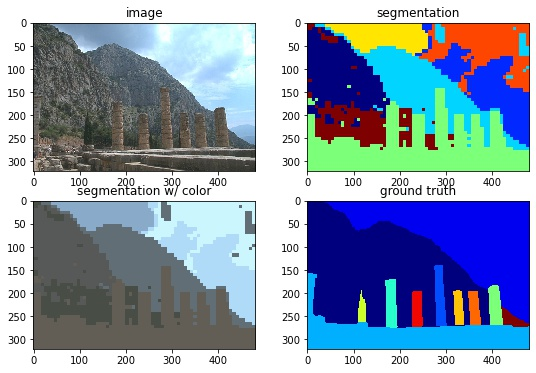

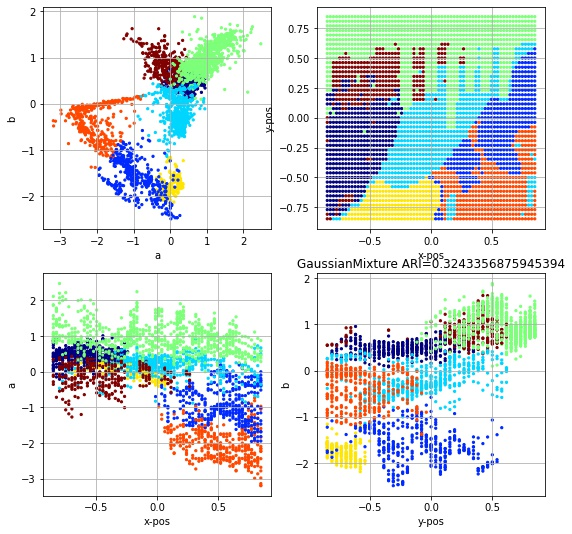

------

------
GaussianMixture
{'covariance_type': 'spherical', 'n_components': 8, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

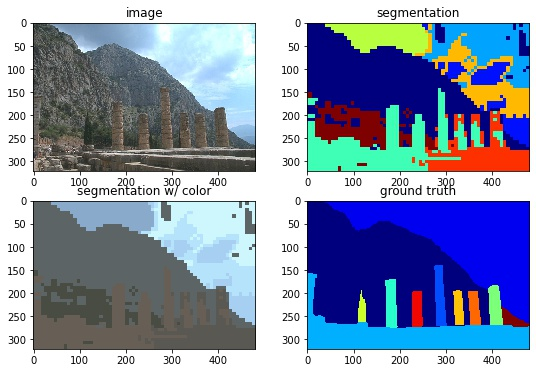

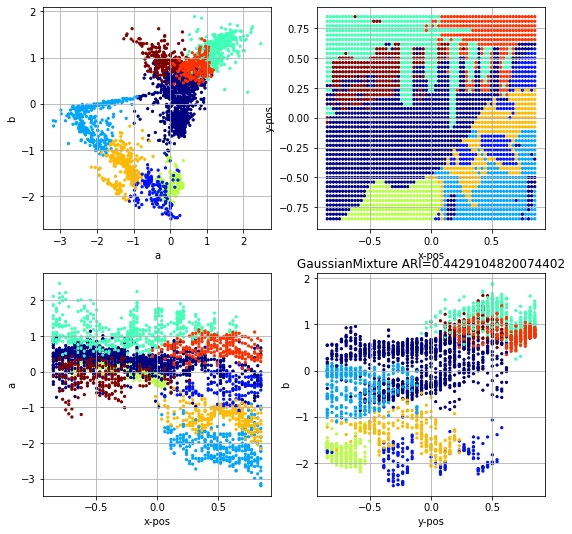

------

------
GaussianMixture
{'covariance_type': 'spherical', 'n_components': 9, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

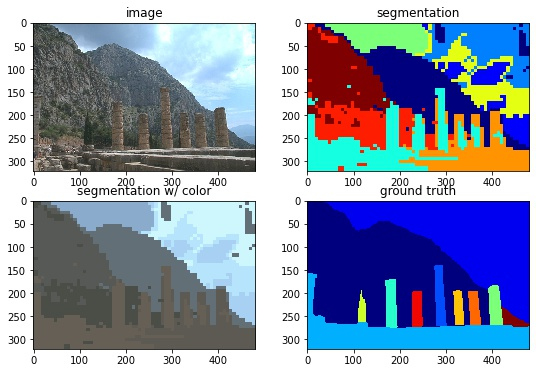

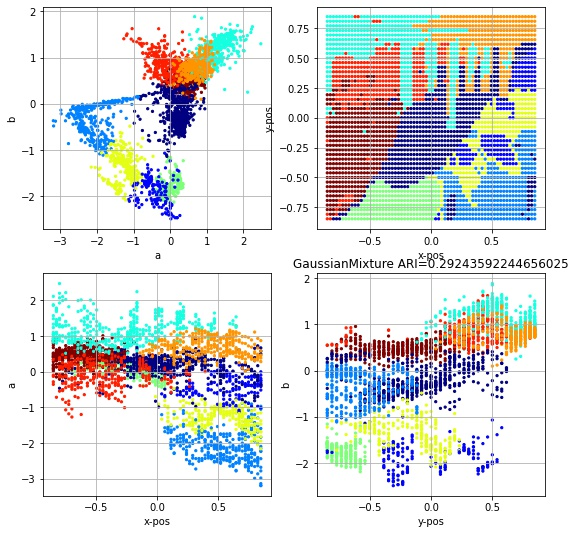

------

------
GaussianMixture
{'covariance_type': 'spherical', 'n_components': 10, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

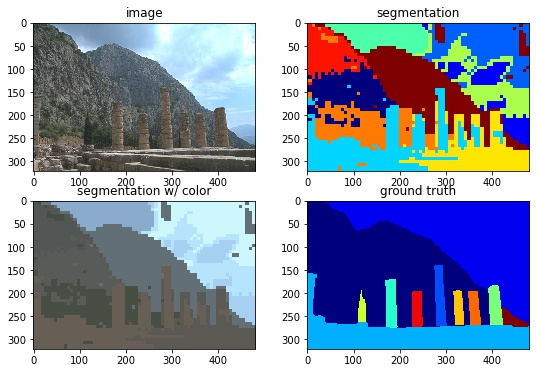

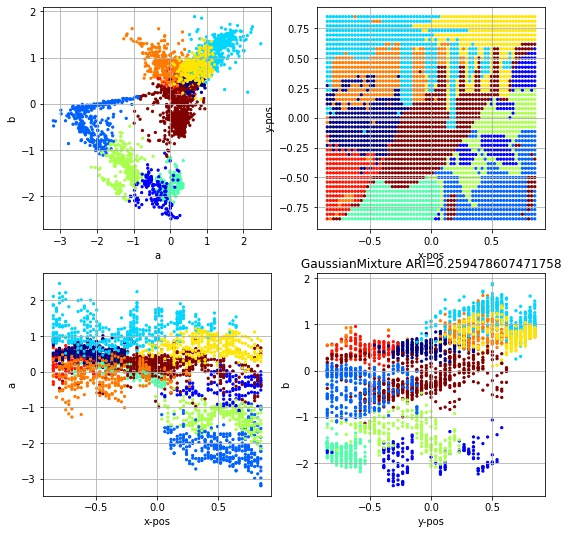

------



In [16]:
for L in results2:   
    print('------')
    print(L['name'])
    print(L['param'])
    plt.figure()
    # show the segmentation
    showsegm(L['segm'], img)

    # show the scatter plot
    showscatter(X,L['Y'])
    plt.title(L['name'] + " ARI=" + str(L['ari']))
    plt.show()
    print('------\n')

In [17]:
from operator import itemgetter
sortedResults = sorted(results2, key=itemgetter('ari'))


In [18]:
for top5 in sortedResults[-5:]:
    print(f'Name: {top5["name"]} -- Params: {top5["param"]} -- ARI: {top5["ari"]}')

Name: GaussianMixture -- Params: {'covariance_type': 'tied', 'n_components': 5, 'random_state': 444} -- ARI: 0.5614498306926722
Name: GaussianMixture -- Params: {'covariance_type': 'spherical', 'n_components': 5, 'random_state': 444} -- ARI: 0.5618535875897841
Name: GaussianMixture -- Params: {'covariance_type': 'spherical', 'n_components': 4, 'random_state': 444} -- ARI: 0.6030665128706534
Name: KMeans -- Params: {'n_clusters': 4, 'random_state': 123} -- ARI: 0.6037546695140711
Name: GaussianMixture -- Params: {'covariance_type': 'tied', 'n_components': 4, 'random_state': 444} -- ARI: 0.6050764855622409


------
GaussianMixture
{'covariance_type': 'tied', 'n_components': 5, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

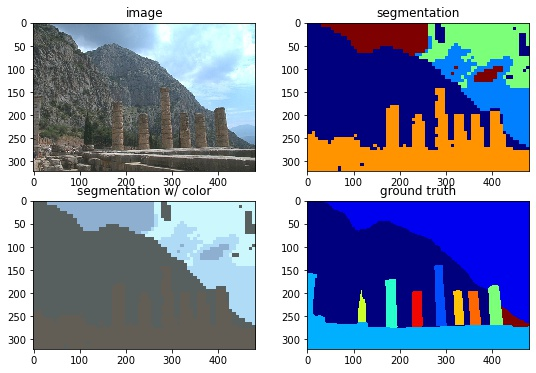

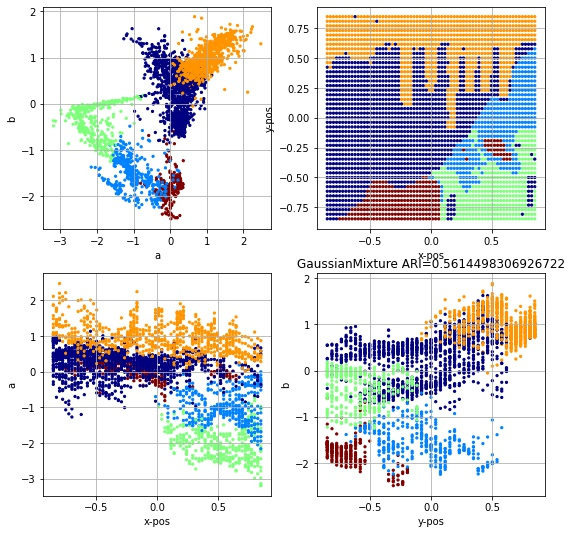

------

------
GaussianMixture
{'covariance_type': 'spherical', 'n_components': 5, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

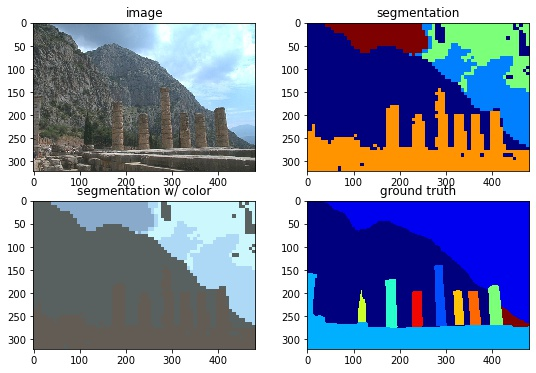

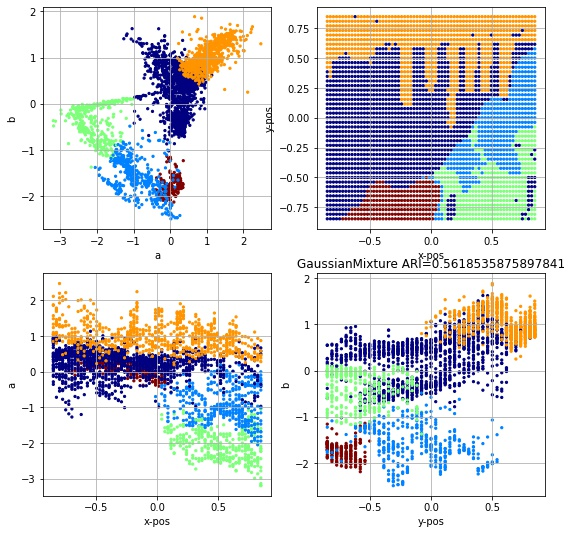

------

------
GaussianMixture
{'covariance_type': 'spherical', 'n_components': 4, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

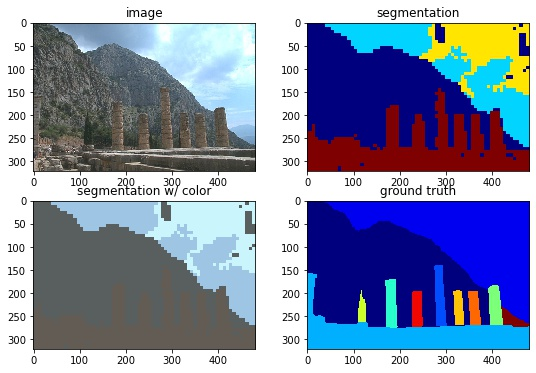

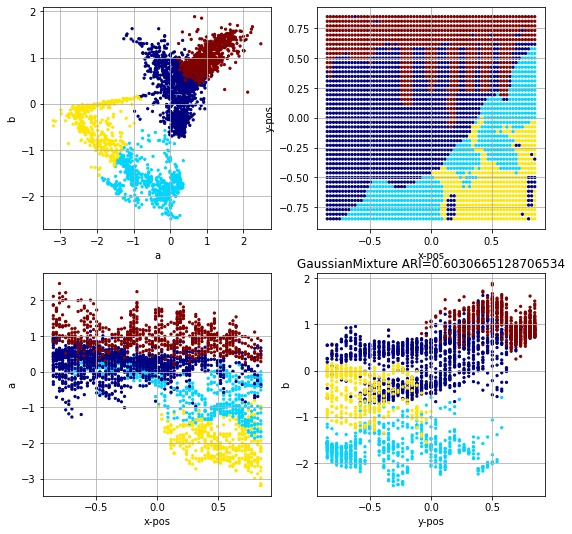

------

------
KMeans
{'n_clusters': 4, 'random_state': 123}


<Figure size 432x288 with 0 Axes>

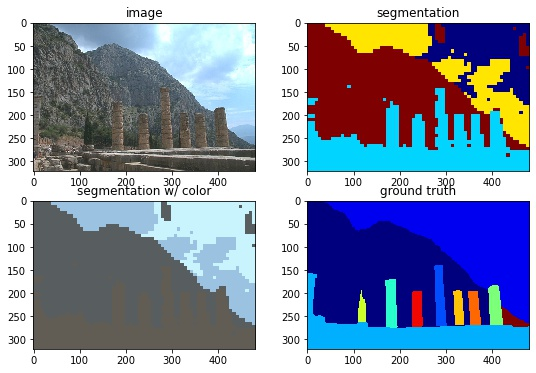

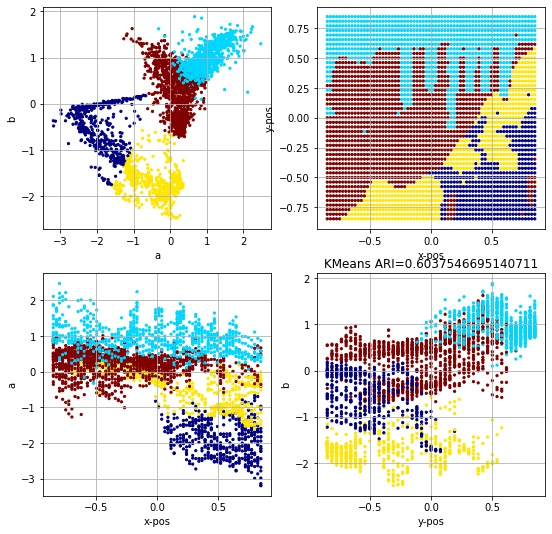

------

------
GaussianMixture
{'covariance_type': 'tied', 'n_components': 4, 'random_state': 444}


<Figure size 432x288 with 0 Axes>

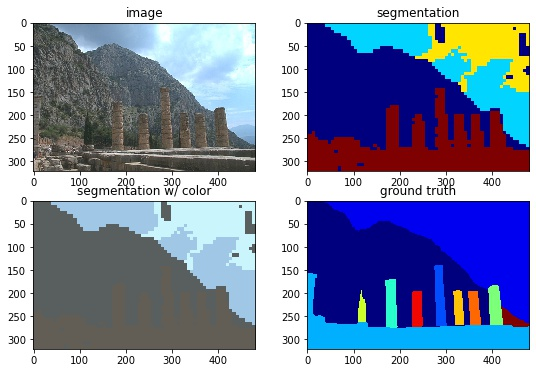

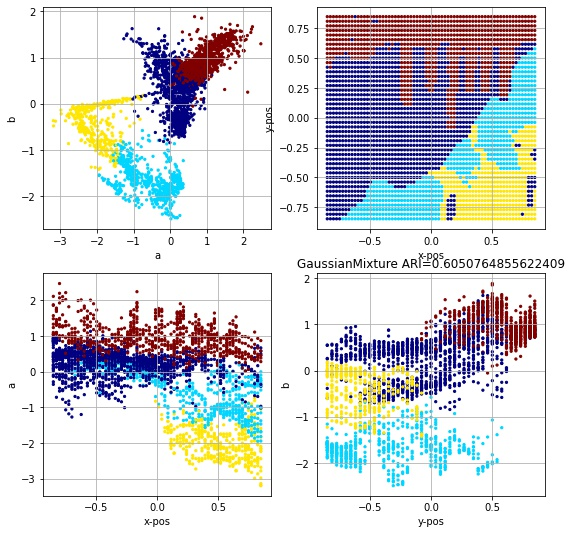

------



In [19]:
for L in sortedResults[-5:]:
    print('------')
    print(L['name'])
    print(L['param'])
    plt.figure()
    # show the segmentation
    showsegm(L['segm'], img)

    # show the scatter plot
    showscatter(X,L['Y'])
    plt.title(L['name'] + " ARI=" + str(L['ari']))
    plt.show()
    print('------\n')

_Which method performs the best?  Why?_

Overall, it can be seen that the best method is GMM: better similarity to ground truth images and it obtains the most important features from the image (structures, sky, and two different mountains). This conclusion comes from the idea that GMM uses the covariance matrix for clustering, therefore it doesnt have fixed clusters shapes as it does have Kmeans (spherical). In this case, GMM gives a better result because a spherical solution for our clusters is not a great choice.

Also, a fun fact about the models is that the second model is KMeans and the 3rd best model is GMM with spherical covariance matrix, both with 4 number of components or clusters. The intresting part is that both models have very similar results, and they both give us an ARI 0.603. Therefore, mixing this results with what we studied at Lecture we can see how related this two models are, inferring that probably the identity matrix is the covariance matrix for GMM with spherical covariance matrix hyperparameter.

_Does including the position features improve the segmentation results?_

Including the position features does improve the performance of the model. The clusters are much more accurate when we use the x and y possition as features.
As we are working with an image, it is important to use those values for the required task. I believe because x and y coordenates are spatial correlated, when we are using them we will have a deeper approach for training the model.